#<font color='Navy'>**Import Essential Libraries**</font>

In [ ]:
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as T
import torch
import torch.nn as nn
from torchvision.utils import make_grid
from torchvision.utils import save_image
from IPython.display import Image
import matplotlib.pyplot as plt
import numpy as np
import random
import os, fnmatch, glob
from glob import glob 
from sklearn.model_selection import train_test_split
%matplotlib inline
from PIL import Image
import torchvision.transforms as tfs
from torch.autograd import Variable as gradEnb
import torch.nn.functional as F
import torch.optim as optim

#<font color='Navy'>**Utilities**</font>

In [ ]:
#http://mi.eng.cam.ac.uk/research/projects/VideoRec/CamVid/data/label_colors.txt
color_dict = {0: (64, 128, 64),
              1: (192, 0, 128),
              2: (0, 128, 192),
              3: (0, 128, 64),
              4: (128, 0, 0),
              5: (64, 0, 128),
              6: (64, 0, 192),
              7:(192, 128, 64),
              8:(192, 192, 128),
              9:(64, 64, 128),
              10:(128, 0, 192),
              11:(192, 0, 64),
              12:(128, 128, 64),
              13:(192, 0, 192),
              14:(128, 64, 64),
              15:(64, 192, 128),
              16:(64, 64, 0),
              17:(128, 64, 128),
              18:(128, 128, 192),
              19:(0, 0, 192),
              20:(192, 128, 128),
              21:(128, 128, 128),
              22:(64, 128, 192),
              23:(0, 0, 64),
              24:(0, 64, 64),
              25:(192, 64, 128),
              26:(128, 128, 0),
              27:(192, 128, 192),
              28:(64, 0, 64),
              29:(192, 192, 0),
              30:(0, 0, 0),
              31:(64, 192, 0)}


#https://stackoverflow.com/questions/43884463/how-to-convert-rgb-image-to-one-hot-encoded-3d-array-based-on-color-using-numpy
def rgb_to_onehot(rgb_arr, color_dict):
    num_classes = len(color_dict)
    shape = rgb_arr.shape[:2]+(num_classes,)
    arr = np.zeros( shape, dtype=np.int8 )
    for i, cls in enumerate(color_dict):
        arr[:,:,i] = np.all(rgb_arr.reshape( (-1,3) ) == color_dict[i], axis=1).reshape(shape[:2])
    return arr

def onehot_to_rgb(onehot, color_dict):
    single_layer = np.argmax(onehot, axis=0)
    output = np.zeros( onehot.shape[1:3]+(3,) )
    for k in color_dict.keys():
        output[single_layer==k] = color_dict[k]
    return np.uint8(output)

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid((images.detach()[:nmax]), nrow=8).permute(1, 2, 0))
def show_batch(dl, nmax=64):
    for images, label in dl:
        label = label.numpy()
        labi = []
        for lab in label:
          labi.append(onehot_to_rgb(lab, color_dict))
        labi = np.asarray(labi)
        labi = torch.from_numpy(labi)
        show_images(images, nmax)
        show_images(labi, nmax)
        break

In [ ]:
#https://stackoverflow.com/questions/16646183/crop-an-image-in-the-centre-using-pil
def resize(img, new_width, new_height):
  width, height = img.size
  left = (width - new_width)/2
  top = (height - new_height)/2
  right = (width + new_width)/2
  bottom = (height + new_height)/2
  # Crop the center of the image
  img = img.crop((left, top, right, bottom))
  return img



In [ ]:
def showResults(epoch_,originalImg, label, predictedResult):
  trans = tfs.Compose([
          tfs.ToTensor(),
          tfs.Normalize([-0.485, -0.456, -0.406], [1/0.229, 1/0.224, 1/0.225])
      ])
  origImg = trans(originalImg[0].transpose([1,2,0]))
  max_idx = torch.argmax(predictedResult, 1, keepdim=True)
  one_hot = torch.FloatTensor(predictedResult.shape)
  one_hot.zero_()
  one_hot.scatter_(1, max_idx, 1)
  labRGB = onehot_to_rgb(label[0], color_dict)
  outRGB = onehot_to_rgb(one_hot[0], color_dict)
  
  fig, axs = plt.subplots(1, 3, figsize=(15,5))
  fig.suptitle('Epoch %d'%epoch_)
  axs[0].imshow(origImg.numpy().transpose([1,2,0]))
  axs[0].set_title('Original Image')
  axs[1].imshow(labRGB)
  axs[1].set_title('True Label')
  axs[2].imshow(outRGB)
  axs[2].set_title('Predicted Output')

  plt.show()

In [ ]:
def calcTestLoss(testloader, net, criterion):
  totalLoss = 0; i = 0
  net.eval()
  with torch.no_grad():
    for img,  imLabel in testloader:
      if torch.cuda.is_available:
        img = img.cuda()
        imLabel =  imLabel.cuda()
      i +=1
      outputs = net(img)
      imLabel_Clnmb = torch.argmax(imLabel, dim=1)
      loss = criterion(outputs, imLabel_Clnmb)
      totalLoss += loss.item()
      
  avgLoss = totalLoss/i
  return avgLoss

In [ ]:
def plotLoss(epoch, trainLoss, testLoss):
  plt.xlabel('Epoch')
  plt.ylabel('Cross Entropy Loss')
  plt.title('Loss')
  plt.plot(epoch, trainLoss, label='Train')
  plt.plot(epoch, testLoss, label = '،Test')
  plt.legend(loc='upper left')
  plt.show()

#<font color='Navy'>**Data Loader**</font>

In [ ]:
class camVidPreprocessor:
  def __init__(self, width, height):
    self.width = width
    self.height = height
  def imgTransformer(self, data):
      data = resize(data, self.width, self.height)
      # Convert the data to tensor and do standardization
      trans = tfs.Compose([
          tfs.ToTensor(),
          tfs.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
      ])
      data = trans(data)
      return data
  def camVidTrans(self, data, label):
    imgTrans = self.imgTransformer(data)
    label = resize(label, self.width, self.height)
    label = rgb_to_onehot(np.asarray(label), color_dict)
    trans = tfs.Compose([
          tfs.ToTensor()])
    label =  trans(label)
    label = torch.from_numpy( np.array(label)).long()
    return imgTrans, label

In [ ]:
class camVidDataset(Dataset):
  def __init__(self, transformer, dataDirs, labelDirs):
    self.trans = transformer
    self.data_list = dataDirs
    self.label_list = labelDirs
  def __getitem__(self, idx):
    img = Image.open(self.data_list[idx])
    label = Image.open(self.label_list[idx])
    img, label = self.trans.camVidTrans(img, label)
    return  img, label
  def __len__(self):
    return len(self.data_list)

#<font color='Navy'>**Preparing Data**</font>

In [ ]:
dataBaseAddr = '/content/drive/MyDrive/Hw2/Camvid/camvid/images/*.png'
labelBaseAddr = '/content/drive/MyDrive/Hw2/Label/*.png'
dataDir = sorted(glob(dataBaseAddr))
labelDir = sorted(glob(labelBaseAddr))

In [ ]:
trainDataDir, testDataDir, trainLabelDir, testLabelDir = train_test_split(dataDir, labelDir, test_size=0.2, random_state=1)

In [ ]:
camvidTrans = camVidPreprocessor(width = 480, height = 360)
trainData = camVidDataset(transformer = camvidTrans, dataDirs = trainDataDir, labelDirs = trainLabelDir)
testData = camVidDataset(transformer = camvidTrans, dataDirs = testDataDir, labelDirs = testLabelDir)
BATCHSIZE = 4
trainDataCamvid = DataLoader(trainData, batch_size=BATCHSIZE, shuffle=True, num_workers=2)
testDataCamvid = DataLoader(testData, batch_size=BATCHSIZE, shuffle=True, num_workers=2)  

#<font color='Navy'>**Segnet Architecture**</font>

In [ ]:
class SegNet(nn.Module):
    def __init__(self):
      super(SegNet, self).__init__()
      PAD = 3
      DIL = 1
      BATCHMOM = 0.1
      self.encoder1 = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=64, kernel_size=(7,7), padding = PAD, dilation = DIL), nn.ReLU())
      self.encoder2 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(7,7), padding = PAD, dilation = DIL), nn.ReLU())
      self.encoder3 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(7,7), padding = PAD, dilation = DIL), nn.ReLU())
      self.encoder4 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(7,7), padding = PAD, dilation = DIL), nn.ReLU())
      self.decoder4 =  nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(7,7), padding = PAD,dilation = DIL))
      self.decoder3 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(7,7), padding = PAD,dilation = DIL))
      self.decoder2 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(7,7), padding = PAD,dilation = DIL))
      self.decoder1 =nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(7,7), padding = PAD,dilation = DIL))
      self.activation = nn.Conv2d(in_channels=64, out_channels=32, kernel_size=(1,1))
    def forward(self, x):
      x1, indDec1 = F.max_pool2d(self.encoder1(x), kernel_size=2, stride=2, return_indices=True)
      x2, indDec2 = F.max_pool2d(self.encoder2(x1), kernel_size=2, stride=2, return_indices=True)
      x3, indDec3 = F.max_pool2d( self.encoder3(x2), kernel_size=2, stride=2, return_indices=True)
      x4, indDec4 = F.max_pool2d( self.encoder4(x3), kernel_size=2, stride=2, return_indices=True)
      x5 = self.decoder4(F.max_unpool2d(x4, indDec4, kernel_size=2, stride=2))
      x5 = F.pad(x5, (0,0,1,0)) 
      x6 = self.decoder3(F.max_unpool2d(x5, indDec3, kernel_size=2, stride=2))
      x7 = self.decoder2(F.max_unpool2d(x6, indDec2, kernel_size=2, stride=2))
      x8 = self.decoder2(F.max_unpool2d(x7, indDec1, kernel_size=2, stride=2))
      xOut = self.activation(x8)
      return xOut

#<font color='Navy'>**Training**</font>

In [ ]:
num_classes = 32
net = SegNet()
lossTrainHist = []; lossTestHist = []; epochHist = []
if torch.cuda.is_available():
    net = net.cuda()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(net.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-8, weight_decay=0.005)

**********Epoch: 1 **********
 Epoch 1,  Iteration     9,  Loss: 5.718
 Epoch 1,  Iteration    19,  Loss: 4.477
 Epoch 1,  Iteration    29,  Loss: 3.985
 Epoch 1,  Iteration    39,  Loss: 3.636
 Epoch 1,  Iteration    49,  Loss: 3.392
 Epoch 1,  Iteration    59,  Loss: 3.225
 Epoch 1,  Iteration    69,  Loss: 3.099
 Epoch 1,  Iteration    79,  Loss: 3.000
 Epoch 1,  Iteration    89,  Loss: 2.907
 Epoch 1,  Iteration    99,  Loss: 2.837
 Epoch 1,  Iteration   109,  Loss: 2.776
 Epoch 1,  Iteration   119,  Loss: 2.722
 Epoch 1,  Iteration   129,  Loss: 2.668
 Epoch 1,  Iteration   139,  Loss: 2.622
TestLoss:  1.8606144322289362


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


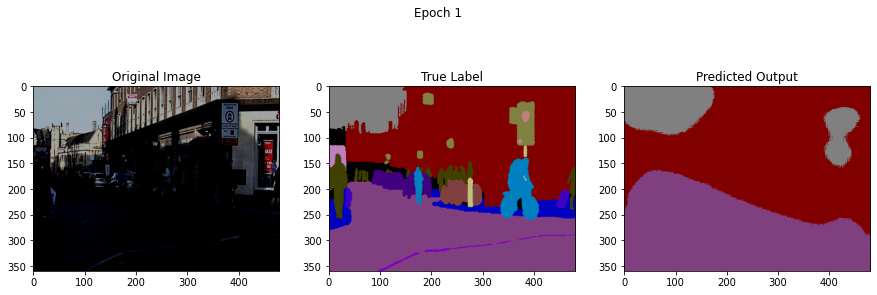

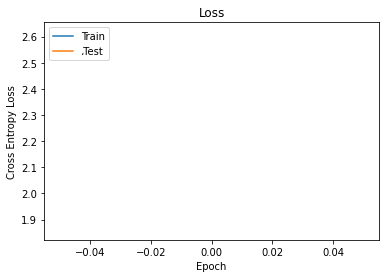

**********Epoch: 2 **********
 Epoch 2,  Iteration     9,  Loss: 1.852
 Epoch 2,  Iteration    19,  Loss: 1.850
 Epoch 2,  Iteration    29,  Loss: 1.946
 Epoch 2,  Iteration    39,  Loss: 1.959
 Epoch 2,  Iteration    49,  Loss: 1.937
 Epoch 2,  Iteration    59,  Loss: 1.893
 Epoch 2,  Iteration    69,  Loss: 1.865
 Epoch 2,  Iteration    79,  Loss: 1.904
 Epoch 2,  Iteration    89,  Loss: 1.913
 Epoch 2,  Iteration    99,  Loss: 1.911
 Epoch 2,  Iteration   109,  Loss: 1.904
 Epoch 2,  Iteration   119,  Loss: 1.907
 Epoch 2,  Iteration   129,  Loss: 1.901
 Epoch 2,  Iteration   139,  Loss: 1.899
TestLoss:  1.8353729910320706


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


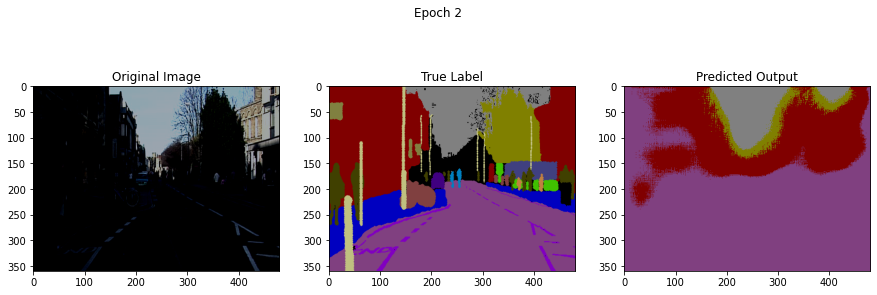

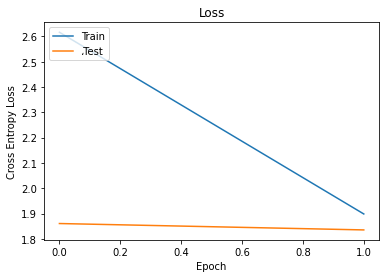

**********Epoch: 3 **********
 Epoch 3,  Iteration     9,  Loss: 1.769
 Epoch 3,  Iteration    19,  Loss: 1.730
 Epoch 3,  Iteration    29,  Loss: 1.681
 Epoch 3,  Iteration    39,  Loss: 1.680
 Epoch 3,  Iteration    49,  Loss: 1.657
 Epoch 3,  Iteration    59,  Loss: 1.627
 Epoch 3,  Iteration    69,  Loss: 1.610
 Epoch 3,  Iteration    79,  Loss: 1.601
 Epoch 3,  Iteration    89,  Loss: 1.597
 Epoch 3,  Iteration    99,  Loss: 1.589
 Epoch 3,  Iteration   109,  Loss: 1.578
 Epoch 3,  Iteration   119,  Loss: 1.566
 Epoch 3,  Iteration   129,  Loss: 1.560
 Epoch 3,  Iteration   139,  Loss: 1.558
TestLoss:  1.4249406721856859


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


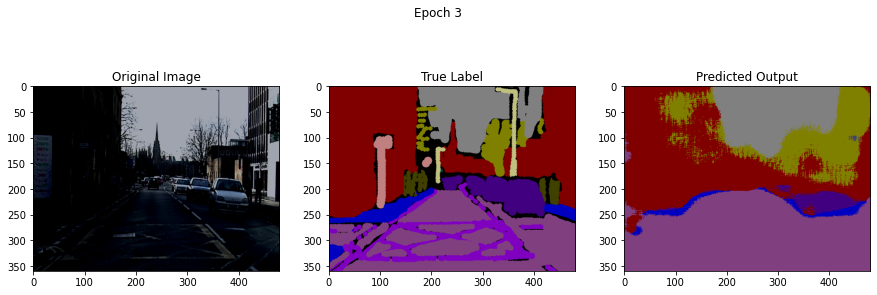

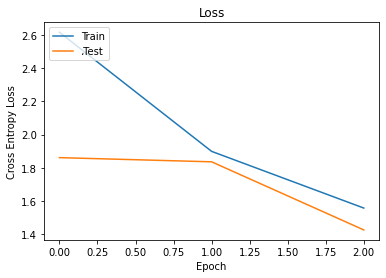

**********Epoch: 4 **********
 Epoch 4,  Iteration     9,  Loss: 1.523
 Epoch 4,  Iteration    19,  Loss: 1.500
 Epoch 4,  Iteration    29,  Loss: 1.467
 Epoch 4,  Iteration    39,  Loss: 1.477
 Epoch 4,  Iteration    49,  Loss: 1.472
 Epoch 4,  Iteration    59,  Loss: 1.449
 Epoch 4,  Iteration    69,  Loss: 1.450
 Epoch 4,  Iteration    79,  Loss: 1.441
 Epoch 4,  Iteration    89,  Loss: 1.438
 Epoch 4,  Iteration    99,  Loss: 1.438
 Epoch 4,  Iteration   109,  Loss: 1.432
 Epoch 4,  Iteration   119,  Loss: 1.437
 Epoch 4,  Iteration   129,  Loss: 1.434
 Epoch 4,  Iteration   139,  Loss: 1.426
TestLoss:  1.3581831852595012


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


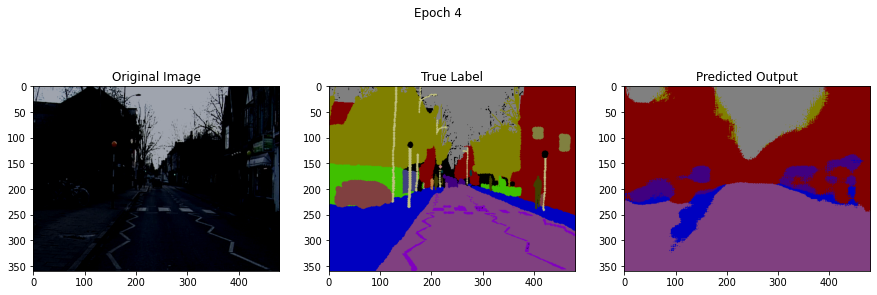

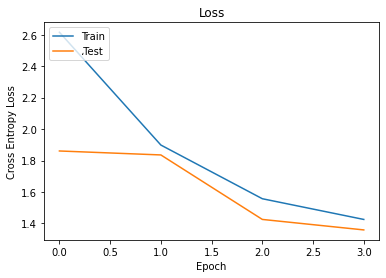

**********Epoch: 5 **********
 Epoch 5,  Iteration     9,  Loss: 1.434
 Epoch 5,  Iteration    19,  Loss: 1.420
 Epoch 5,  Iteration    29,  Loss: 1.386
 Epoch 5,  Iteration    39,  Loss: 1.384
 Epoch 5,  Iteration    49,  Loss: 1.409
 Epoch 5,  Iteration    59,  Loss: 1.409
 Epoch 5,  Iteration    69,  Loss: 1.399
 Epoch 5,  Iteration    79,  Loss: 1.384
 Epoch 5,  Iteration    89,  Loss: 1.368
 Epoch 5,  Iteration    99,  Loss: 1.357
 Epoch 5,  Iteration   109,  Loss: 1.356
 Epoch 5,  Iteration   119,  Loss: 1.360
 Epoch 5,  Iteration   129,  Loss: 1.355
 Epoch 5,  Iteration   139,  Loss: 1.350
TestLoss:  1.3189397090011172


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


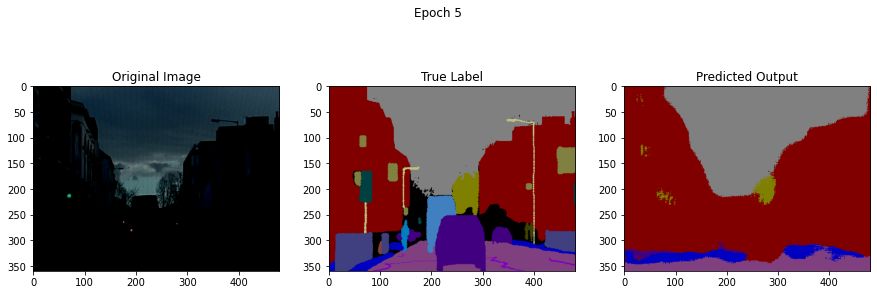

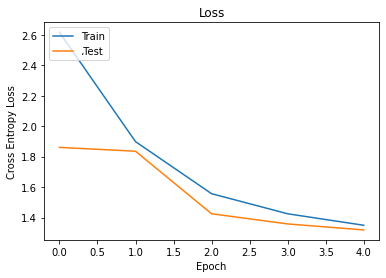

**********Epoch: 6 **********
 Epoch 6,  Iteration     9,  Loss: 1.439
 Epoch 6,  Iteration    19,  Loss: 1.371
 Epoch 6,  Iteration    29,  Loss: 1.358
 Epoch 6,  Iteration    39,  Loss: 1.338
 Epoch 6,  Iteration    49,  Loss: 1.355
 Epoch 6,  Iteration    59,  Loss: 1.363
 Epoch 6,  Iteration    69,  Loss: 1.358
 Epoch 6,  Iteration    79,  Loss: 1.367
 Epoch 6,  Iteration    89,  Loss: 1.381
 Epoch 6,  Iteration    99,  Loss: 1.381
 Epoch 6,  Iteration   109,  Loss: 1.388
 Epoch 6,  Iteration   119,  Loss: 1.400
 Epoch 6,  Iteration   129,  Loss: 1.402
 Epoch 6,  Iteration   139,  Loss: 1.392
TestLoss:  1.2999649163749483


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


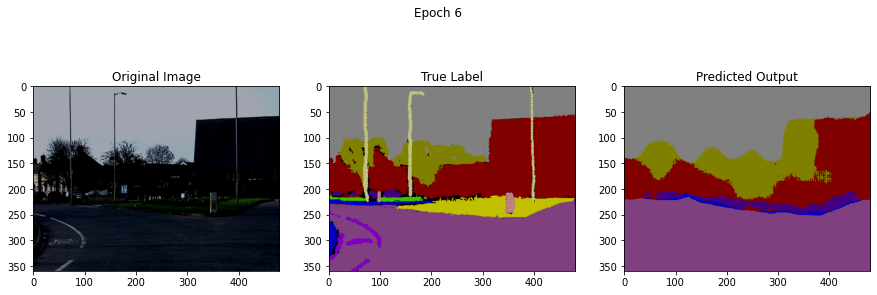

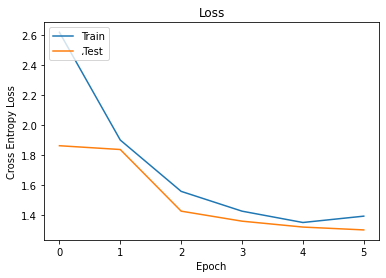

**********Epoch: 7 **********
 Epoch 7,  Iteration     9,  Loss: 1.433
 Epoch 7,  Iteration    19,  Loss: 1.409
 Epoch 7,  Iteration    29,  Loss: 1.362
 Epoch 7,  Iteration    39,  Loss: 1.314
 Epoch 7,  Iteration    49,  Loss: 1.315
 Epoch 7,  Iteration    59,  Loss: 1.304
 Epoch 7,  Iteration    69,  Loss: 1.317
 Epoch 7,  Iteration    79,  Loss: 1.306
 Epoch 7,  Iteration    89,  Loss: 1.304
 Epoch 7,  Iteration    99,  Loss: 1.306
 Epoch 7,  Iteration   109,  Loss: 1.300
 Epoch 7,  Iteration   119,  Loss: 1.297
 Epoch 7,  Iteration   129,  Loss: 1.310
 Epoch 7,  Iteration   139,  Loss: 1.304
TestLoss:  1.2621760037210252


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


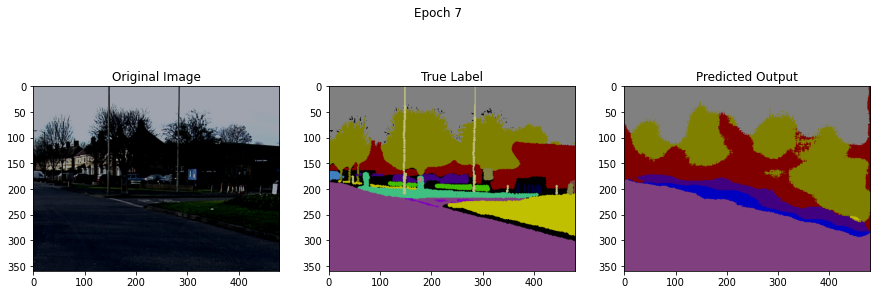

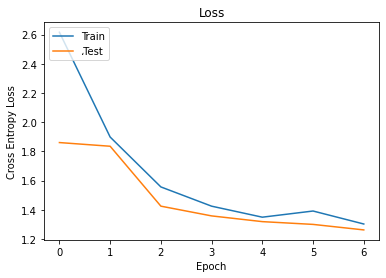

**********Epoch: 8 **********
 Epoch 8,  Iteration     9,  Loss: 1.256
 Epoch 8,  Iteration    19,  Loss: 1.268
 Epoch 8,  Iteration    29,  Loss: 1.281
 Epoch 8,  Iteration    39,  Loss: 1.288
 Epoch 8,  Iteration    49,  Loss: 1.315
 Epoch 8,  Iteration    59,  Loss: 1.313
 Epoch 8,  Iteration    69,  Loss: 1.300
 Epoch 8,  Iteration    79,  Loss: 1.300
 Epoch 8,  Iteration    89,  Loss: 1.286
 Epoch 8,  Iteration    99,  Loss: 1.291
 Epoch 8,  Iteration   109,  Loss: 1.279
 Epoch 8,  Iteration   119,  Loss: 1.284
 Epoch 8,  Iteration   129,  Loss: 1.293
 Epoch 8,  Iteration   139,  Loss: 1.295
TestLoss:  1.3585311041937933


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


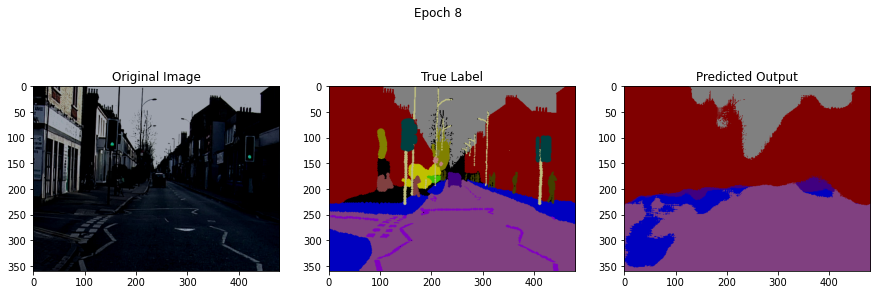

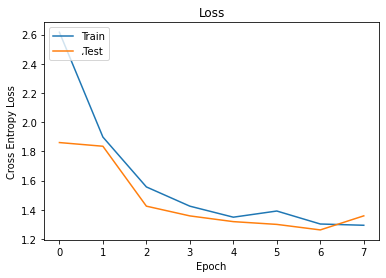

**********Epoch: 9 **********
 Epoch 9,  Iteration     9,  Loss: 1.307
 Epoch 9,  Iteration    19,  Loss: 1.315
 Epoch 9,  Iteration    29,  Loss: 1.317
 Epoch 9,  Iteration    39,  Loss: 1.308
 Epoch 9,  Iteration    49,  Loss: 1.290
 Epoch 9,  Iteration    59,  Loss: 1.282
 Epoch 9,  Iteration    69,  Loss: 1.276
 Epoch 9,  Iteration    79,  Loss: 1.267
 Epoch 9,  Iteration    89,  Loss: 1.263
 Epoch 9,  Iteration    99,  Loss: 1.254
 Epoch 9,  Iteration   109,  Loss: 1.251
 Epoch 9,  Iteration   119,  Loss: 1.253
 Epoch 9,  Iteration   129,  Loss: 1.257
 Epoch 9,  Iteration   139,  Loss: 1.260
TestLoss:  1.2220784260167017


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


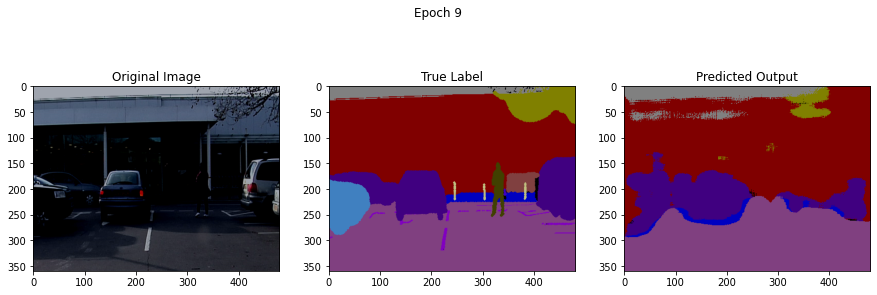

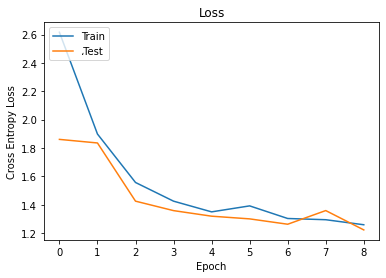

**********Epoch: 10 **********
 Epoch 10,  Iteration     9,  Loss: 1.229
 Epoch 10,  Iteration    19,  Loss: 1.192
 Epoch 10,  Iteration    29,  Loss: 1.257
 Epoch 10,  Iteration    39,  Loss: 1.230
 Epoch 10,  Iteration    49,  Loss: 1.258
 Epoch 10,  Iteration    59,  Loss: 1.252
 Epoch 10,  Iteration    69,  Loss: 1.241
 Epoch 10,  Iteration    79,  Loss: 1.236
 Epoch 10,  Iteration    89,  Loss: 1.228
 Epoch 10,  Iteration    99,  Loss: 1.234
 Epoch 10,  Iteration   109,  Loss: 1.231
 Epoch 10,  Iteration   119,  Loss: 1.236
 Epoch 10,  Iteration   129,  Loss: 1.231
 Epoch 10,  Iteration   139,  Loss: 1.228
TestLoss:  1.2243061247799132


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


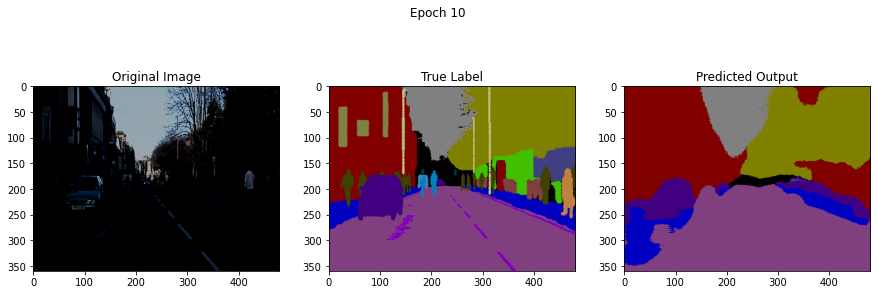

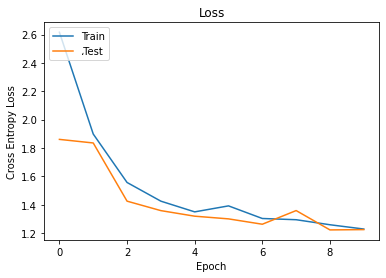

**********Epoch: 11 **********
 Epoch 11,  Iteration     9,  Loss: 1.165
 Epoch 11,  Iteration    19,  Loss: 1.172
 Epoch 11,  Iteration    29,  Loss: 1.202
 Epoch 11,  Iteration    39,  Loss: 1.197
 Epoch 11,  Iteration    49,  Loss: 1.204
 Epoch 11,  Iteration    59,  Loss: 1.212
 Epoch 11,  Iteration    69,  Loss: 1.203
 Epoch 11,  Iteration    79,  Loss: 1.198
 Epoch 11,  Iteration    89,  Loss: 1.194
 Epoch 11,  Iteration    99,  Loss: 1.197
 Epoch 11,  Iteration   109,  Loss: 1.199
 Epoch 11,  Iteration   119,  Loss: 1.201
 Epoch 11,  Iteration   129,  Loss: 1.200
 Epoch 11,  Iteration   139,  Loss: 1.199
TestLoss:  1.161765906545851


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


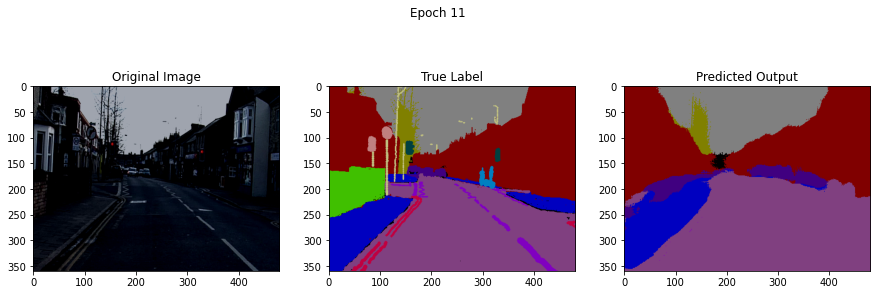

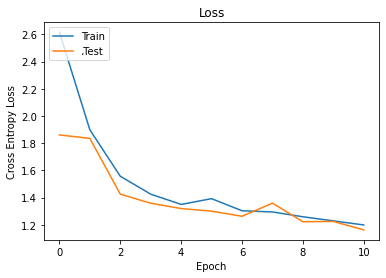

**********Epoch: 12 **********
 Epoch 12,  Iteration     9,  Loss: 1.168
 Epoch 12,  Iteration    19,  Loss: 1.174
 Epoch 12,  Iteration    29,  Loss: 1.169
 Epoch 12,  Iteration    39,  Loss: 1.151
 Epoch 12,  Iteration    49,  Loss: 1.158
 Epoch 12,  Iteration    59,  Loss: 1.150
 Epoch 12,  Iteration    69,  Loss: 1.172
 Epoch 12,  Iteration    79,  Loss: 1.173
 Epoch 12,  Iteration    89,  Loss: 1.171
 Epoch 12,  Iteration    99,  Loss: 1.175
 Epoch 12,  Iteration   109,  Loss: 1.166
 Epoch 12,  Iteration   119,  Loss: 1.157
 Epoch 12,  Iteration   129,  Loss: 1.164
 Epoch 12,  Iteration   139,  Loss: 1.170
TestLoss:  1.2147460381189983


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


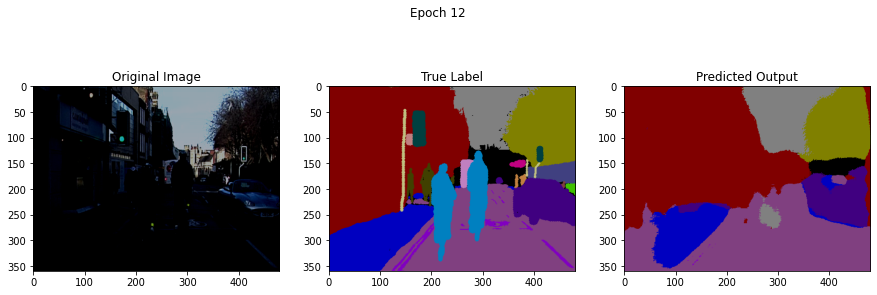

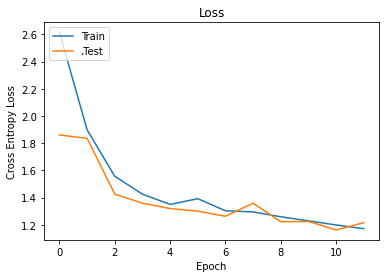

**********Epoch: 13 **********
 Epoch 13,  Iteration     9,  Loss: 1.119
 Epoch 13,  Iteration    19,  Loss: 1.187
 Epoch 13,  Iteration    29,  Loss: 1.177
 Epoch 13,  Iteration    39,  Loss: 1.196
 Epoch 13,  Iteration    49,  Loss: 1.211
 Epoch 13,  Iteration    59,  Loss: 1.193
 Epoch 13,  Iteration    69,  Loss: 1.183
 Epoch 13,  Iteration    79,  Loss: 1.173
 Epoch 13,  Iteration    89,  Loss: 1.172
 Epoch 13,  Iteration    99,  Loss: 1.170
 Epoch 13,  Iteration   109,  Loss: 1.168
 Epoch 13,  Iteration   119,  Loss: 1.167
 Epoch 13,  Iteration   129,  Loss: 1.159
 Epoch 13,  Iteration   139,  Loss: 1.151
TestLoss:  1.1296267641915216


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


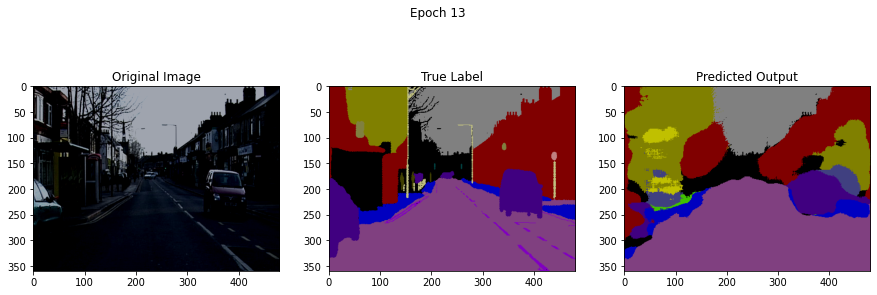

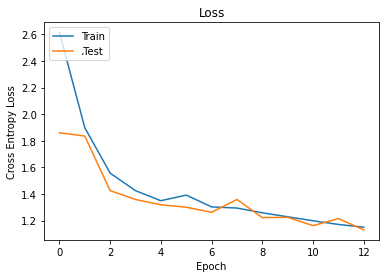

**********Epoch: 14 **********
 Epoch 14,  Iteration     9,  Loss: 1.203
 Epoch 14,  Iteration    19,  Loss: 1.149
 Epoch 14,  Iteration    29,  Loss: 1.131
 Epoch 14,  Iteration    39,  Loss: 1.129
 Epoch 14,  Iteration    49,  Loss: 1.148
 Epoch 14,  Iteration    59,  Loss: 1.159
 Epoch 14,  Iteration    69,  Loss: 1.163
 Epoch 14,  Iteration    79,  Loss: 1.156
 Epoch 14,  Iteration    89,  Loss: 1.145
 Epoch 14,  Iteration    99,  Loss: 1.140
 Epoch 14,  Iteration   109,  Loss: 1.140
 Epoch 14,  Iteration   119,  Loss: 1.134
 Epoch 14,  Iteration   129,  Loss: 1.139
 Epoch 14,  Iteration   139,  Loss: 1.134
TestLoss:  1.1293381883038416


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


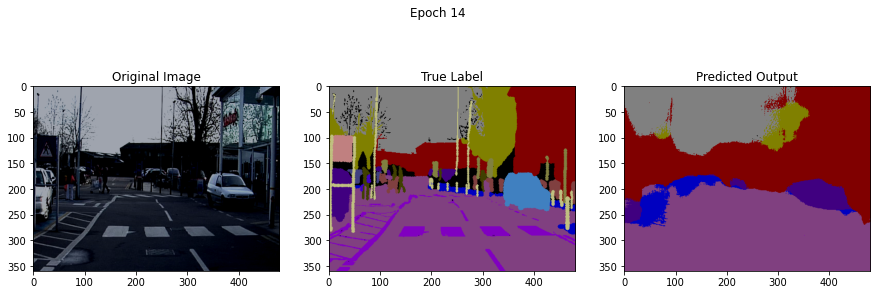

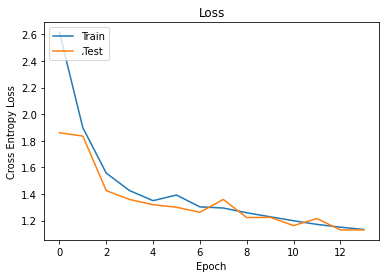

**********Epoch: 15 **********
 Epoch 15,  Iteration     9,  Loss: 1.070
 Epoch 15,  Iteration    19,  Loss: 1.076
 Epoch 15,  Iteration    29,  Loss: 1.060
 Epoch 15,  Iteration    39,  Loss: 1.081
 Epoch 15,  Iteration    49,  Loss: 1.067
 Epoch 15,  Iteration    59,  Loss: 1.098
 Epoch 15,  Iteration    69,  Loss: 1.116
 Epoch 15,  Iteration    79,  Loss: 1.122
 Epoch 15,  Iteration    89,  Loss: 1.125
 Epoch 15,  Iteration    99,  Loss: 1.130
 Epoch 15,  Iteration   109,  Loss: 1.138
 Epoch 15,  Iteration   119,  Loss: 1.160
 Epoch 15,  Iteration   129,  Loss: 1.159
 Epoch 15,  Iteration   139,  Loss: 1.157
TestLoss:  1.1294159938891728


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


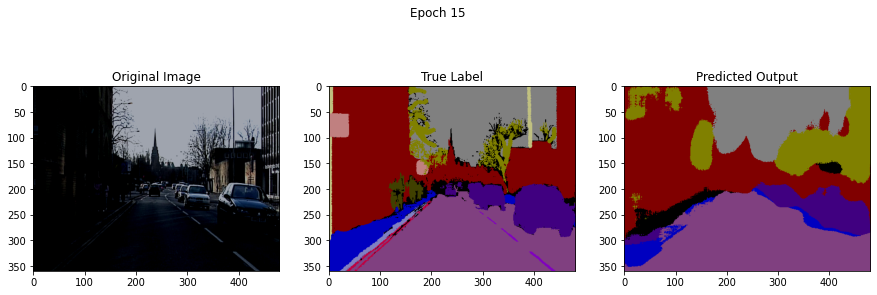

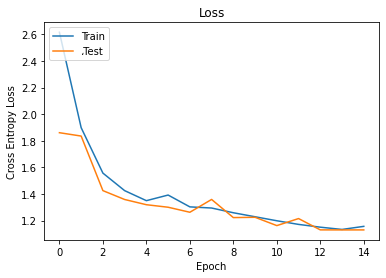

**********Epoch: 16 **********
 Epoch 16,  Iteration     9,  Loss: 1.089
 Epoch 16,  Iteration    19,  Loss: 1.108
 Epoch 16,  Iteration    29,  Loss: 1.152
 Epoch 16,  Iteration    39,  Loss: 1.159
 Epoch 16,  Iteration    49,  Loss: 1.154
 Epoch 16,  Iteration    59,  Loss: 1.165
 Epoch 16,  Iteration    69,  Loss: 1.174
 Epoch 16,  Iteration    79,  Loss: 1.174
 Epoch 16,  Iteration    89,  Loss: 1.161
 Epoch 16,  Iteration    99,  Loss: 1.156
 Epoch 16,  Iteration   109,  Loss: 1.153
 Epoch 16,  Iteration   119,  Loss: 1.149
 Epoch 16,  Iteration   129,  Loss: 1.139
 Epoch 16,  Iteration   139,  Loss: 1.132
TestLoss:  1.059075900250011


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


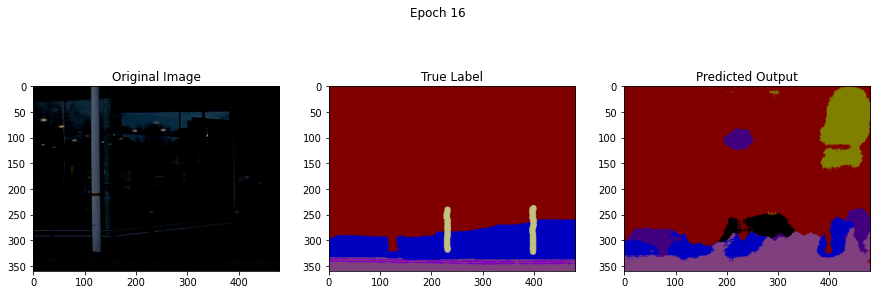

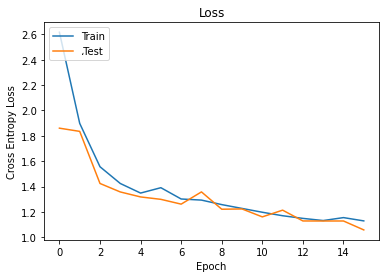

**********Epoch: 17 **********
 Epoch 17,  Iteration     9,  Loss: 1.029
 Epoch 17,  Iteration    19,  Loss: 1.079
 Epoch 17,  Iteration    29,  Loss: 1.114
 Epoch 17,  Iteration    39,  Loss: 1.085
 Epoch 17,  Iteration    49,  Loss: 1.082
 Epoch 17,  Iteration    59,  Loss: 1.084
 Epoch 17,  Iteration    69,  Loss: 1.078
 Epoch 17,  Iteration    79,  Loss: 1.084
 Epoch 17,  Iteration    89,  Loss: 1.081
 Epoch 17,  Iteration    99,  Loss: 1.079
 Epoch 17,  Iteration   109,  Loss: 1.090
 Epoch 17,  Iteration   119,  Loss: 1.088
 Epoch 17,  Iteration   129,  Loss: 1.084
 Epoch 17,  Iteration   139,  Loss: 1.087
TestLoss:  1.176987008916007


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


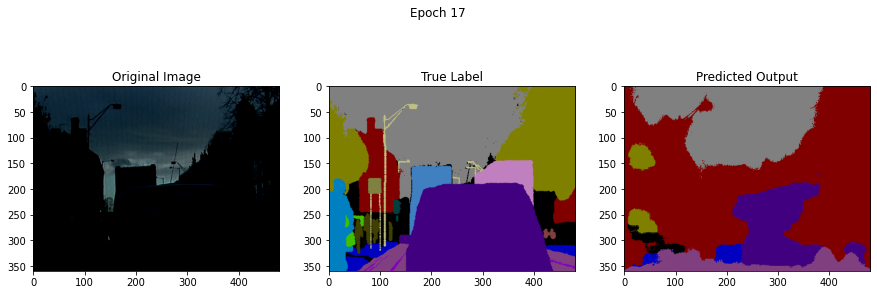

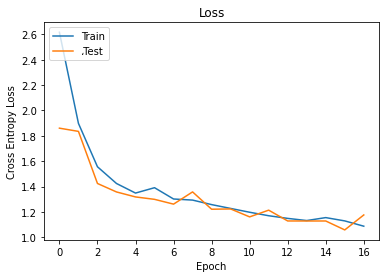

**********Epoch: 18 **********
 Epoch 18,  Iteration     9,  Loss: 1.093
 Epoch 18,  Iteration    19,  Loss: 1.066
 Epoch 18,  Iteration    29,  Loss: 1.086
 Epoch 18,  Iteration    39,  Loss: 1.097
 Epoch 18,  Iteration    49,  Loss: 1.094
 Epoch 18,  Iteration    59,  Loss: 1.102
 Epoch 18,  Iteration    69,  Loss: 1.113
 Epoch 18,  Iteration    79,  Loss: 1.113
 Epoch 18,  Iteration    89,  Loss: 1.108
 Epoch 18,  Iteration    99,  Loss: 1.101
 Epoch 18,  Iteration   109,  Loss: 1.095
 Epoch 18,  Iteration   119,  Loss: 1.081
 Epoch 18,  Iteration   129,  Loss: 1.076
 Epoch 18,  Iteration   139,  Loss: 1.078
TestLoss:  1.0451622737778559


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


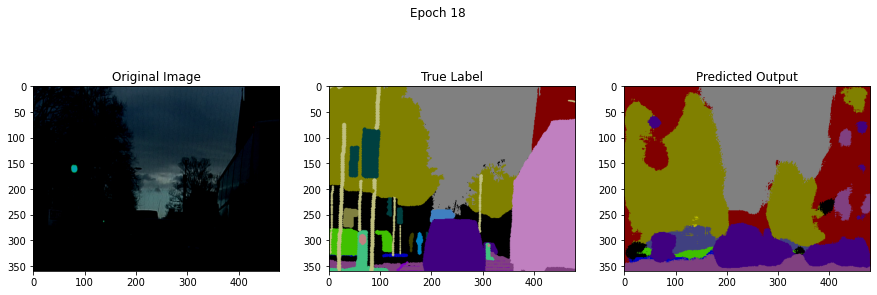

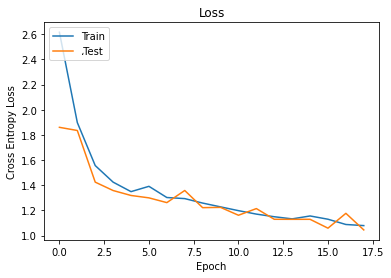

**********Epoch: 19 **********
 Epoch 19,  Iteration     9,  Loss: 1.162
 Epoch 19,  Iteration    19,  Loss: 1.102
 Epoch 19,  Iteration    29,  Loss: 1.089
 Epoch 19,  Iteration    39,  Loss: 1.073
 Epoch 19,  Iteration    49,  Loss: 1.084
 Epoch 19,  Iteration    59,  Loss: 1.092
 Epoch 19,  Iteration    69,  Loss: 1.091
 Epoch 19,  Iteration    79,  Loss: 1.082
 Epoch 19,  Iteration    89,  Loss: 1.079
 Epoch 19,  Iteration    99,  Loss: 1.072
 Epoch 19,  Iteration   109,  Loss: 1.069
 Epoch 19,  Iteration   119,  Loss: 1.071
 Epoch 19,  Iteration   129,  Loss: 1.071
 Epoch 19,  Iteration   139,  Loss: 1.065
TestLoss:  1.0685056497653325


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


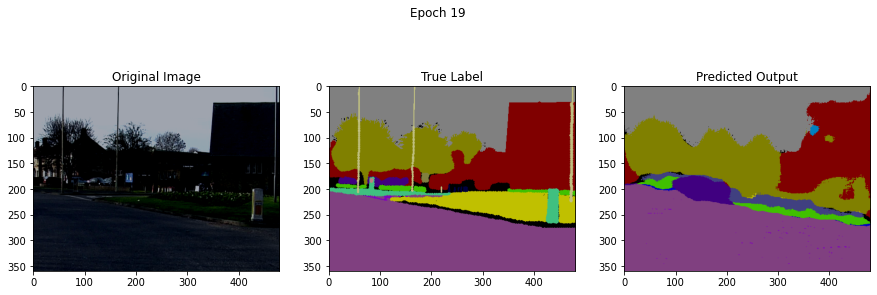

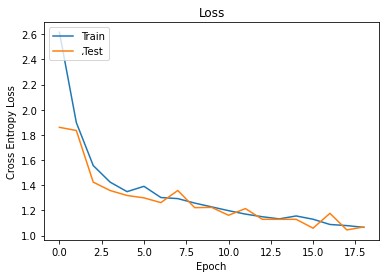

**********Epoch: 20 **********
 Epoch 20,  Iteration     9,  Loss: 1.049
 Epoch 20,  Iteration    19,  Loss: 1.066
 Epoch 20,  Iteration    29,  Loss: 1.037
 Epoch 20,  Iteration    39,  Loss: 1.020
 Epoch 20,  Iteration    49,  Loss: 1.033
 Epoch 20,  Iteration    59,  Loss: 1.021
 Epoch 20,  Iteration    69,  Loss: 1.019
 Epoch 20,  Iteration    79,  Loss: 1.016
 Epoch 20,  Iteration    89,  Loss: 1.034
 Epoch 20,  Iteration    99,  Loss: 1.039
 Epoch 20,  Iteration   109,  Loss: 1.044
 Epoch 20,  Iteration   119,  Loss: 1.043
 Epoch 20,  Iteration   129,  Loss: 1.049
 Epoch 20,  Iteration   139,  Loss: 1.052
TestLoss:  1.0319984787040286


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


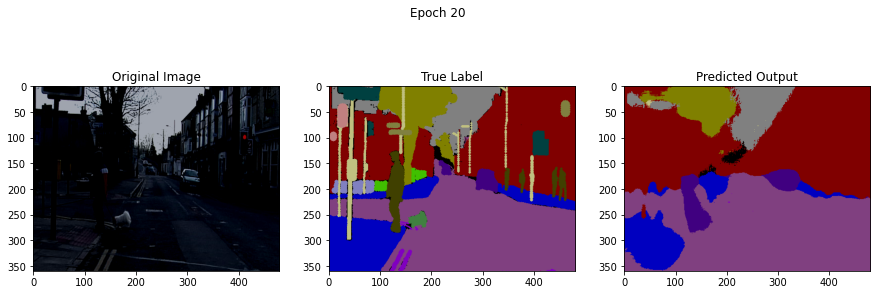

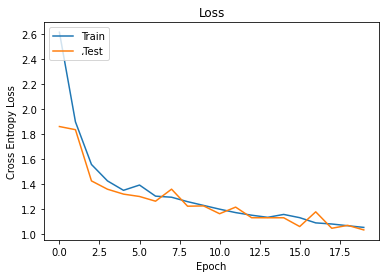

**********Epoch: 21 **********
 Epoch 21,  Iteration     9,  Loss: 0.998
 Epoch 21,  Iteration    19,  Loss: 1.041
 Epoch 21,  Iteration    29,  Loss: 1.044
 Epoch 21,  Iteration    39,  Loss: 1.019
 Epoch 21,  Iteration    49,  Loss: 1.015
 Epoch 21,  Iteration    59,  Loss: 1.023
 Epoch 21,  Iteration    69,  Loss: 1.032
 Epoch 21,  Iteration    79,  Loss: 1.032
 Epoch 21,  Iteration    89,  Loss: 1.039
 Epoch 21,  Iteration    99,  Loss: 1.042
 Epoch 21,  Iteration   109,  Loss: 1.038
 Epoch 21,  Iteration   119,  Loss: 1.040
 Epoch 21,  Iteration   129,  Loss: 1.033
 Epoch 21,  Iteration   139,  Loss: 1.030
TestLoss:  1.0072160346640482


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


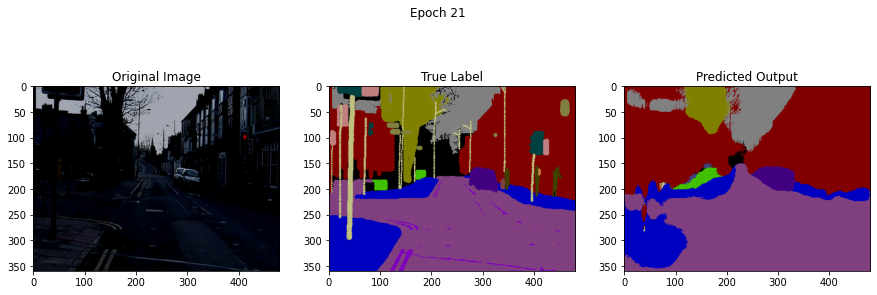

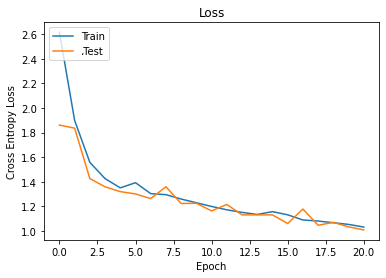

**********Epoch: 22 **********
 Epoch 22,  Iteration     9,  Loss: 0.994
 Epoch 22,  Iteration    19,  Loss: 1.011
 Epoch 22,  Iteration    29,  Loss: 1.021
 Epoch 22,  Iteration    39,  Loss: 1.022
 Epoch 22,  Iteration    49,  Loss: 1.026
 Epoch 22,  Iteration    59,  Loss: 1.027
 Epoch 22,  Iteration    69,  Loss: 1.024
 Epoch 22,  Iteration    79,  Loss: 1.024
 Epoch 22,  Iteration    89,  Loss: 1.025
 Epoch 22,  Iteration    99,  Loss: 1.034
 Epoch 22,  Iteration   109,  Loss: 1.029
 Epoch 22,  Iteration   119,  Loss: 1.020
 Epoch 22,  Iteration   129,  Loss: 1.024
 Epoch 22,  Iteration   139,  Loss: 1.027
TestLoss:  1.0470385750134785


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


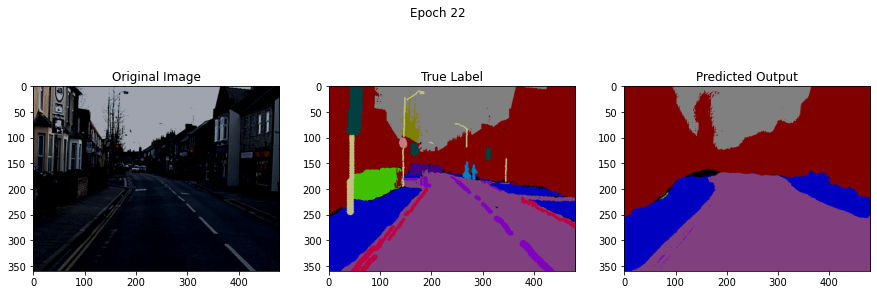

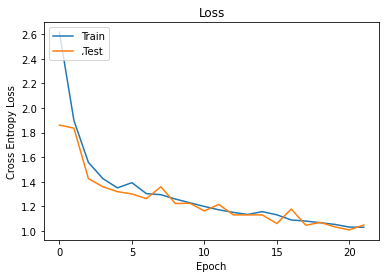

**********Epoch: 23 **********
 Epoch 23,  Iteration     9,  Loss: 1.024
 Epoch 23,  Iteration    19,  Loss: 1.006
 Epoch 23,  Iteration    29,  Loss: 0.987
 Epoch 23,  Iteration    39,  Loss: 0.977
 Epoch 23,  Iteration    49,  Loss: 0.985
 Epoch 23,  Iteration    59,  Loss: 1.014
 Epoch 23,  Iteration    69,  Loss: 1.019
 Epoch 23,  Iteration    79,  Loss: 1.017
 Epoch 23,  Iteration    89,  Loss: 1.027
 Epoch 23,  Iteration    99,  Loss: 1.023
 Epoch 23,  Iteration   109,  Loss: 1.032
 Epoch 23,  Iteration   119,  Loss: 1.023
 Epoch 23,  Iteration   129,  Loss: 1.019
 Epoch 23,  Iteration   139,  Loss: 1.015
TestLoss:  0.9796490768591563


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


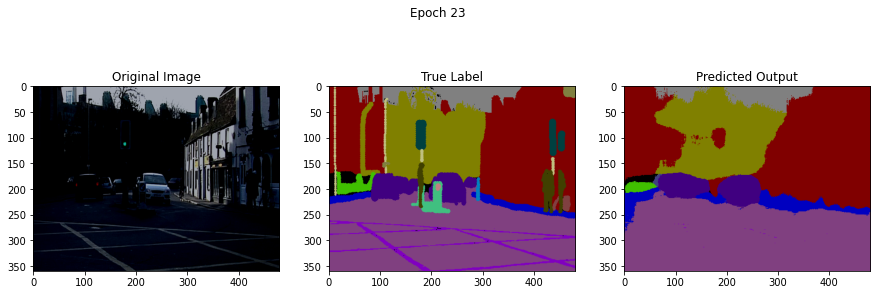

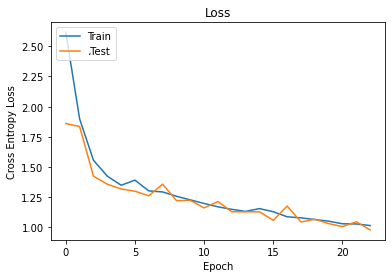

**********Epoch: 24 **********
 Epoch 24,  Iteration     9,  Loss: 0.956
 Epoch 24,  Iteration    19,  Loss: 0.994
 Epoch 24,  Iteration    29,  Loss: 1.002
 Epoch 24,  Iteration    39,  Loss: 0.992
 Epoch 24,  Iteration    49,  Loss: 0.982
 Epoch 24,  Iteration    59,  Loss: 0.965
 Epoch 24,  Iteration    69,  Loss: 0.968
 Epoch 24,  Iteration    79,  Loss: 0.983
 Epoch 24,  Iteration    89,  Loss: 0.990
 Epoch 24,  Iteration    99,  Loss: 0.993
 Epoch 24,  Iteration   109,  Loss: 1.000
 Epoch 24,  Iteration   119,  Loss: 1.001
 Epoch 24,  Iteration   129,  Loss: 1.014
 Epoch 24,  Iteration   139,  Loss: 1.016
TestLoss:  0.993179945482148


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


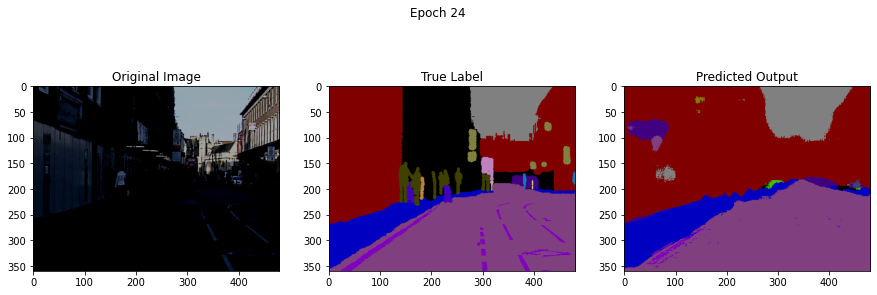

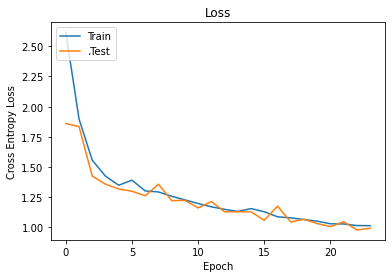

**********Epoch: 25 **********
 Epoch 25,  Iteration     9,  Loss: 0.994
 Epoch 25,  Iteration    19,  Loss: 1.003
 Epoch 25,  Iteration    29,  Loss: 0.981
 Epoch 25,  Iteration    39,  Loss: 0.983
 Epoch 25,  Iteration    49,  Loss: 1.011
 Epoch 25,  Iteration    59,  Loss: 1.033
 Epoch 25,  Iteration    69,  Loss: 1.034
 Epoch 25,  Iteration    79,  Loss: 1.026
 Epoch 25,  Iteration    89,  Loss: 1.027
 Epoch 25,  Iteration    99,  Loss: 1.025
 Epoch 25,  Iteration   109,  Loss: 1.023
 Epoch 25,  Iteration   119,  Loss: 1.020
 Epoch 25,  Iteration   129,  Loss: 1.018
 Epoch 25,  Iteration   139,  Loss: 1.011
TestLoss:  0.973187815811899


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


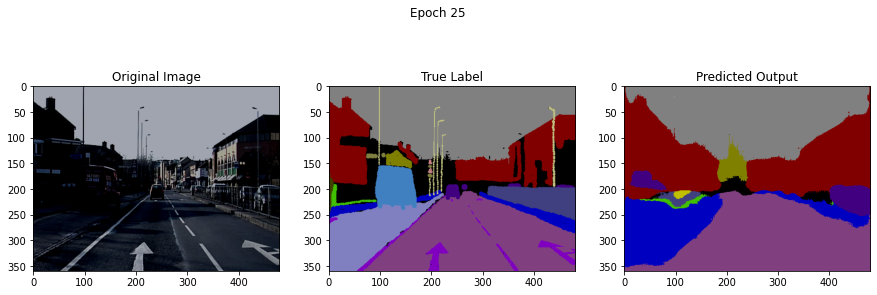

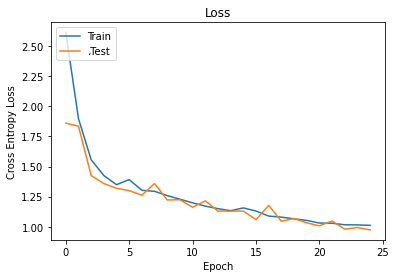

**********Epoch: 26 **********
 Epoch 26,  Iteration     9,  Loss: 1.026
 Epoch 26,  Iteration    19,  Loss: 1.002
 Epoch 26,  Iteration    29,  Loss: 0.982
 Epoch 26,  Iteration    39,  Loss: 0.995
 Epoch 26,  Iteration    49,  Loss: 0.998
 Epoch 26,  Iteration    59,  Loss: 0.989
 Epoch 26,  Iteration    69,  Loss: 0.989
 Epoch 26,  Iteration    79,  Loss: 0.986
 Epoch 26,  Iteration    89,  Loss: 0.988
 Epoch 26,  Iteration    99,  Loss: 0.990
 Epoch 26,  Iteration   109,  Loss: 0.994
 Epoch 26,  Iteration   119,  Loss: 0.993
 Epoch 26,  Iteration   129,  Loss: 0.995
 Epoch 26,  Iteration   139,  Loss: 0.993
TestLoss:  0.9632184356451035


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


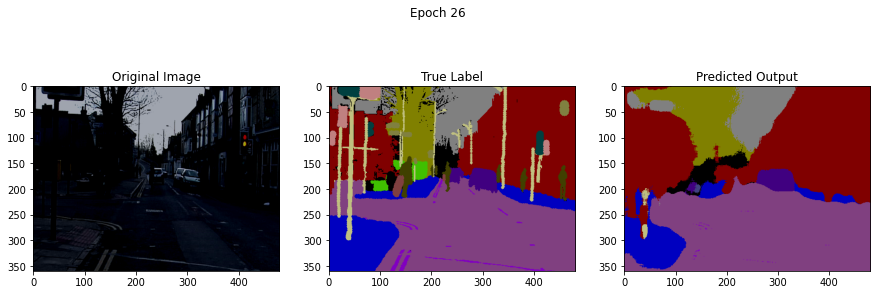

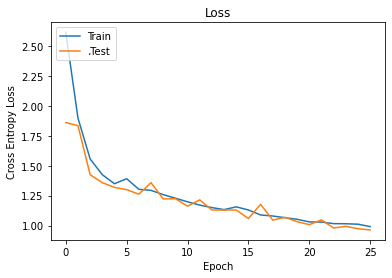

**********Epoch: 27 **********
 Epoch 27,  Iteration     9,  Loss: 0.960
 Epoch 27,  Iteration    19,  Loss: 1.044
 Epoch 27,  Iteration    29,  Loss: 0.994
 Epoch 27,  Iteration    39,  Loss: 0.968
 Epoch 27,  Iteration    49,  Loss: 0.982
 Epoch 27,  Iteration    59,  Loss: 0.977
 Epoch 27,  Iteration    69,  Loss: 0.989
 Epoch 27,  Iteration    79,  Loss: 0.988
 Epoch 27,  Iteration    89,  Loss: 0.996
 Epoch 27,  Iteration    99,  Loss: 0.993
 Epoch 27,  Iteration   109,  Loss: 0.989
 Epoch 27,  Iteration   119,  Loss: 0.993
 Epoch 27,  Iteration   129,  Loss: 0.989
 Epoch 27,  Iteration   139,  Loss: 0.987
TestLoss:  1.03293500509527


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


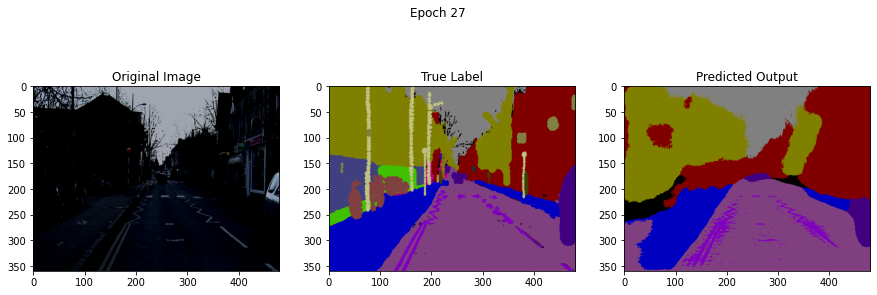

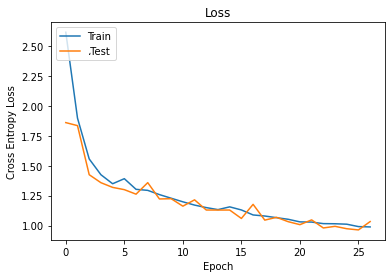

**********Epoch: 28 **********
 Epoch 28,  Iteration     9,  Loss: 0.907
 Epoch 28,  Iteration    19,  Loss: 0.914
 Epoch 28,  Iteration    29,  Loss: 0.961
 Epoch 28,  Iteration    39,  Loss: 0.963
 Epoch 28,  Iteration    49,  Loss: 0.964
 Epoch 28,  Iteration    59,  Loss: 0.967
 Epoch 28,  Iteration    69,  Loss: 0.960
 Epoch 28,  Iteration    79,  Loss: 0.971
 Epoch 28,  Iteration    89,  Loss: 0.967
 Epoch 28,  Iteration    99,  Loss: 0.979
 Epoch 28,  Iteration   109,  Loss: 0.988
 Epoch 28,  Iteration   119,  Loss: 0.994
 Epoch 28,  Iteration   129,  Loss: 0.995
 Epoch 28,  Iteration   139,  Loss: 0.996
TestLoss:  1.0194216039445665


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


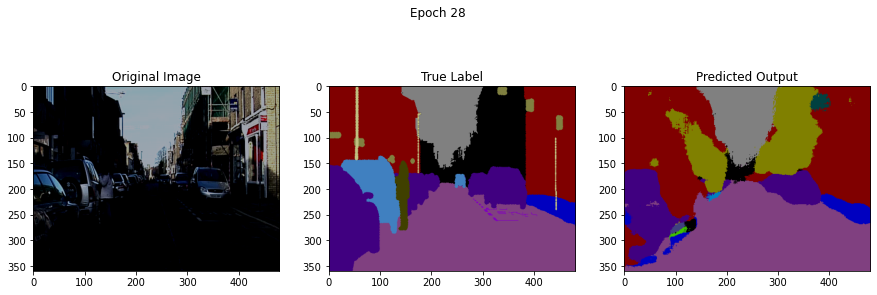

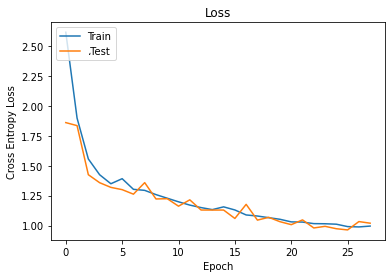

**********Epoch: 29 **********
 Epoch 29,  Iteration     9,  Loss: 0.988
 Epoch 29,  Iteration    19,  Loss: 0.992
 Epoch 29,  Iteration    29,  Loss: 1.007
 Epoch 29,  Iteration    39,  Loss: 0.993
 Epoch 29,  Iteration    49,  Loss: 0.981
 Epoch 29,  Iteration    59,  Loss: 0.984
 Epoch 29,  Iteration    69,  Loss: 0.986
 Epoch 29,  Iteration    79,  Loss: 0.980
 Epoch 29,  Iteration    89,  Loss: 0.975
 Epoch 29,  Iteration    99,  Loss: 0.976
 Epoch 29,  Iteration   109,  Loss: 0.974
 Epoch 29,  Iteration   119,  Loss: 0.983
 Epoch 29,  Iteration   129,  Loss: 0.985
 Epoch 29,  Iteration   139,  Loss: 0.979
TestLoss:  0.9556507335768806


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


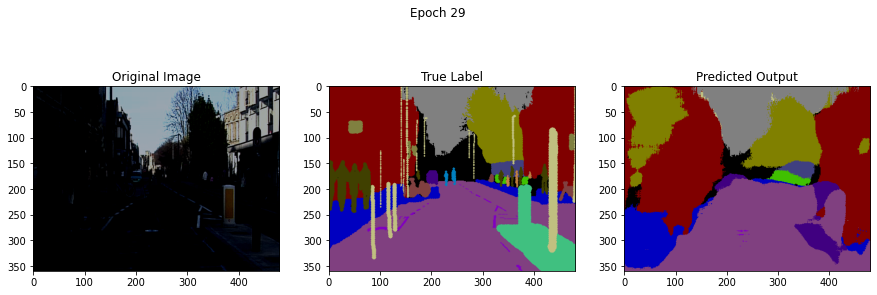

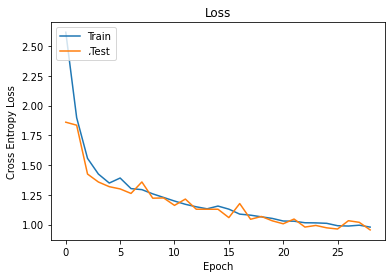

**********Epoch: 30 **********
 Epoch 30,  Iteration     9,  Loss: 0.861
 Epoch 30,  Iteration    19,  Loss: 0.880
 Epoch 30,  Iteration    29,  Loss: 0.928
 Epoch 30,  Iteration    39,  Loss: 0.939
 Epoch 30,  Iteration    49,  Loss: 0.948
 Epoch 30,  Iteration    59,  Loss: 0.945
 Epoch 30,  Iteration    69,  Loss: 0.955
 Epoch 30,  Iteration    79,  Loss: 0.960
 Epoch 30,  Iteration    89,  Loss: 0.964
 Epoch 30,  Iteration    99,  Loss: 0.972
 Epoch 30,  Iteration   109,  Loss: 0.971
 Epoch 30,  Iteration   119,  Loss: 0.980
 Epoch 30,  Iteration   129,  Loss: 0.974
 Epoch 30,  Iteration   139,  Loss: 0.968
TestLoss:  0.9495324095090231


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


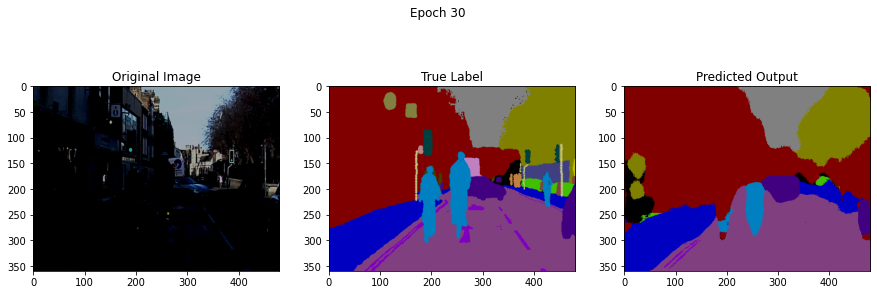

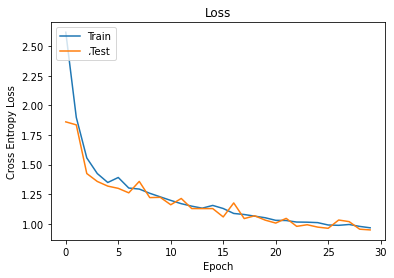

**********Epoch: 31 **********
 Epoch 31,  Iteration     9,  Loss: 0.945
 Epoch 31,  Iteration    19,  Loss: 0.952
 Epoch 31,  Iteration    29,  Loss: 0.943
 Epoch 31,  Iteration    39,  Loss: 0.936
 Epoch 31,  Iteration    49,  Loss: 0.939
 Epoch 31,  Iteration    59,  Loss: 0.942
 Epoch 31,  Iteration    69,  Loss: 0.929
 Epoch 31,  Iteration    79,  Loss: 0.933
 Epoch 31,  Iteration    89,  Loss: 0.943
 Epoch 31,  Iteration    99,  Loss: 0.946
 Epoch 31,  Iteration   109,  Loss: 0.948
 Epoch 31,  Iteration   119,  Loss: 0.952
 Epoch 31,  Iteration   129,  Loss: 0.951
 Epoch 31,  Iteration   139,  Loss: 0.955
TestLoss:  0.9697885827885734


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


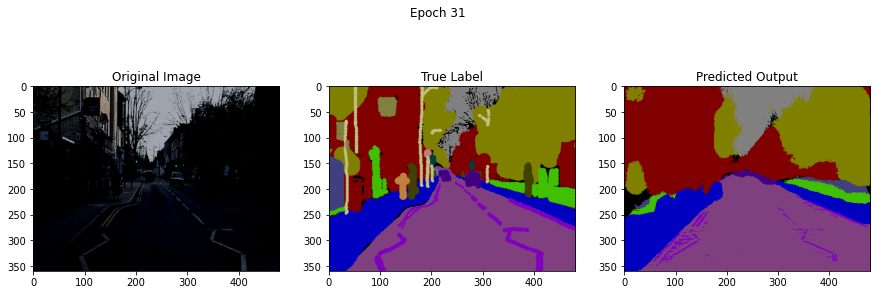

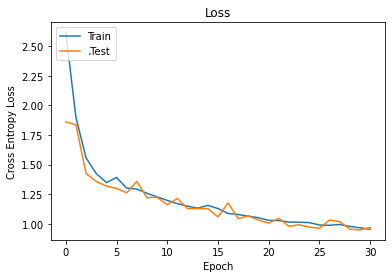

**********Epoch: 32 **********
 Epoch 32,  Iteration     9,  Loss: 0.947
 Epoch 32,  Iteration    19,  Loss: 0.958
 Epoch 32,  Iteration    29,  Loss: 0.944
 Epoch 32,  Iteration    39,  Loss: 0.925
 Epoch 32,  Iteration    49,  Loss: 0.936
 Epoch 32,  Iteration    59,  Loss: 0.946
 Epoch 32,  Iteration    69,  Loss: 0.947
 Epoch 32,  Iteration    79,  Loss: 0.963
 Epoch 32,  Iteration    89,  Loss: 0.970
 Epoch 32,  Iteration    99,  Loss: 0.972
 Epoch 32,  Iteration   109,  Loss: 0.978
 Epoch 32,  Iteration   119,  Loss: 0.977
 Epoch 32,  Iteration   129,  Loss: 0.972
 Epoch 32,  Iteration   139,  Loss: 0.989
TestLoss:  1.2162119034263823


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


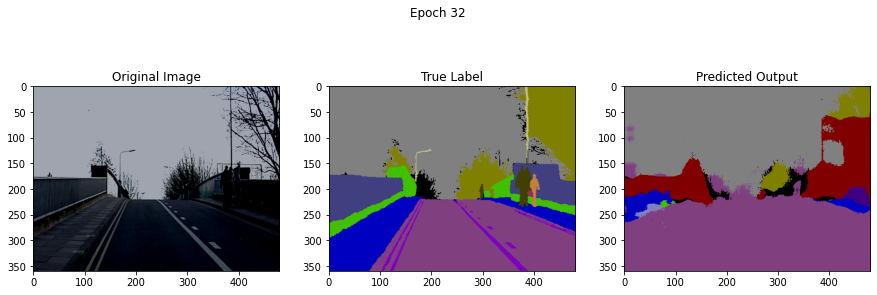

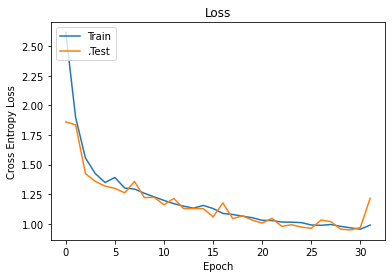

**********Epoch: 33 **********
 Epoch 33,  Iteration     9,  Loss: 1.086
 Epoch 33,  Iteration    19,  Loss: 1.052
 Epoch 33,  Iteration    29,  Loss: 1.020
 Epoch 33,  Iteration    39,  Loss: 1.044
 Epoch 33,  Iteration    49,  Loss: 1.045
 Epoch 33,  Iteration    59,  Loss: 1.022
 Epoch 33,  Iteration    69,  Loss: 1.015
 Epoch 33,  Iteration    79,  Loss: 1.009
 Epoch 33,  Iteration    89,  Loss: 0.999
 Epoch 33,  Iteration    99,  Loss: 1.013
 Epoch 33,  Iteration   109,  Loss: 1.004
 Epoch 33,  Iteration   119,  Loss: 1.005
 Epoch 33,  Iteration   129,  Loss: 1.001
 Epoch 33,  Iteration   139,  Loss: 0.999
TestLoss:  0.9467856503195233


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


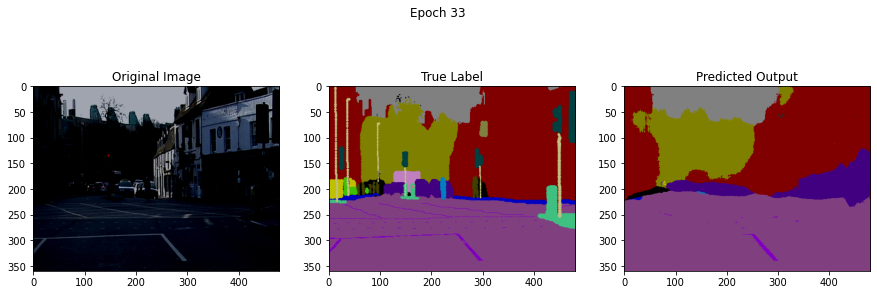

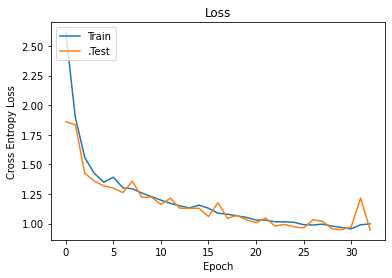

**********Epoch: 34 **********
 Epoch 34,  Iteration     9,  Loss: 0.893
 Epoch 34,  Iteration    19,  Loss: 0.919
 Epoch 34,  Iteration    29,  Loss: 0.924
 Epoch 34,  Iteration    39,  Loss: 0.931
 Epoch 34,  Iteration    49,  Loss: 0.932
 Epoch 34,  Iteration    59,  Loss: 0.930
 Epoch 34,  Iteration    69,  Loss: 0.938
 Epoch 34,  Iteration    79,  Loss: 0.937
 Epoch 34,  Iteration    89,  Loss: 0.932
 Epoch 34,  Iteration    99,  Loss: 0.929
 Epoch 34,  Iteration   109,  Loss: 0.927
 Epoch 34,  Iteration   119,  Loss: 0.927
 Epoch 34,  Iteration   129,  Loss: 0.936
 Epoch 34,  Iteration   139,  Loss: 0.941
TestLoss:  1.0118303216165967


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


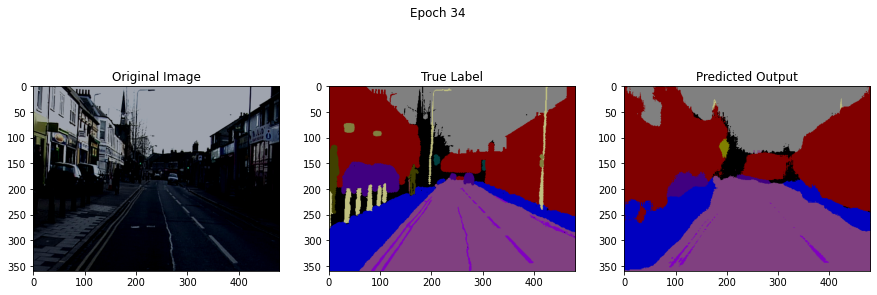

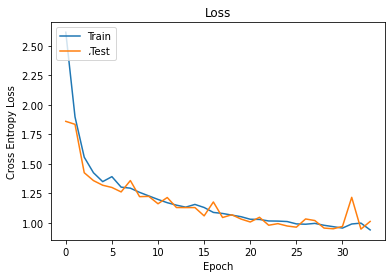

**********Epoch: 35 **********
 Epoch 35,  Iteration     9,  Loss: 0.891
 Epoch 35,  Iteration    19,  Loss: 0.932
 Epoch 35,  Iteration    29,  Loss: 0.927
 Epoch 35,  Iteration    39,  Loss: 0.923
 Epoch 35,  Iteration    49,  Loss: 0.930
 Epoch 35,  Iteration    59,  Loss: 0.917
 Epoch 35,  Iteration    69,  Loss: 0.916
 Epoch 35,  Iteration    79,  Loss: 0.916
 Epoch 35,  Iteration    89,  Loss: 0.919
 Epoch 35,  Iteration    99,  Loss: 0.916
 Epoch 35,  Iteration   109,  Loss: 0.921
 Epoch 35,  Iteration   119,  Loss: 0.929
 Epoch 35,  Iteration   129,  Loss: 0.932
 Epoch 35,  Iteration   139,  Loss: 0.938
TestLoss:  0.9477132078674104


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


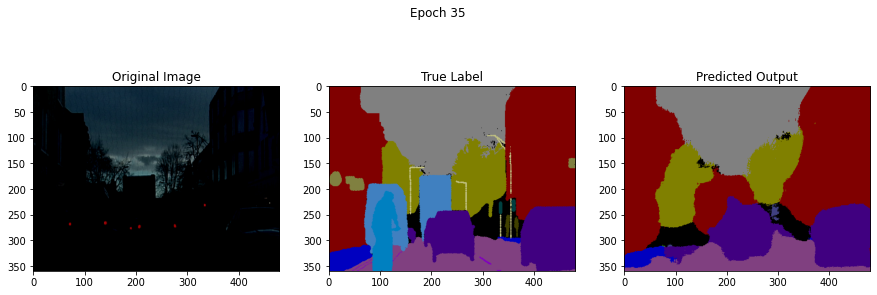

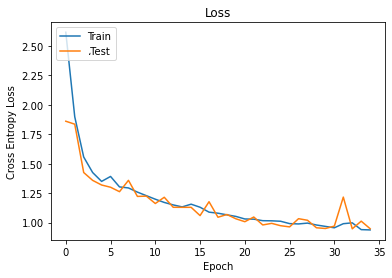

**********Epoch: 36 **********
 Epoch 36,  Iteration     9,  Loss: 0.950
 Epoch 36,  Iteration    19,  Loss: 0.977
 Epoch 36,  Iteration    29,  Loss: 0.952
 Epoch 36,  Iteration    39,  Loss: 0.938
 Epoch 36,  Iteration    49,  Loss: 0.930
 Epoch 36,  Iteration    59,  Loss: 0.935
 Epoch 36,  Iteration    69,  Loss: 0.942
 Epoch 36,  Iteration    79,  Loss: 0.937
 Epoch 36,  Iteration    89,  Loss: 0.934
 Epoch 36,  Iteration    99,  Loss: 0.938
 Epoch 36,  Iteration   109,  Loss: 0.933
 Epoch 36,  Iteration   119,  Loss: 0.935
 Epoch 36,  Iteration   129,  Loss: 0.936
 Epoch 36,  Iteration   139,  Loss: 0.941
TestLoss:  1.01560654077265


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


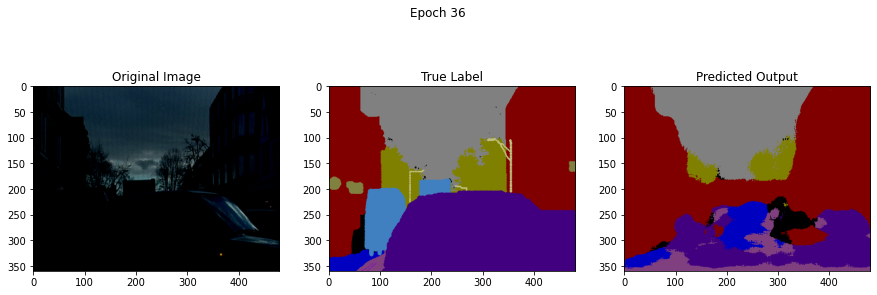

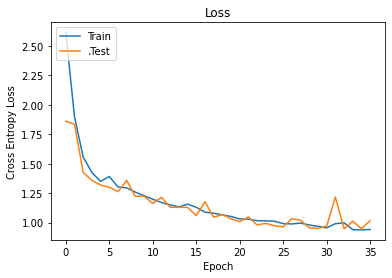

**********Epoch: 37 **********
 Epoch 37,  Iteration     9,  Loss: 0.948
 Epoch 37,  Iteration    19,  Loss: 0.935
 Epoch 37,  Iteration    29,  Loss: 0.959
 Epoch 37,  Iteration    39,  Loss: 0.993
 Epoch 37,  Iteration    49,  Loss: 0.996
 Epoch 37,  Iteration    59,  Loss: 0.978
 Epoch 37,  Iteration    69,  Loss: 0.969
 Epoch 37,  Iteration    79,  Loss: 0.957
 Epoch 37,  Iteration    89,  Loss: 0.964
 Epoch 37,  Iteration    99,  Loss: 0.954
 Epoch 37,  Iteration   109,  Loss: 0.950
 Epoch 37,  Iteration   119,  Loss: 0.946
 Epoch 37,  Iteration   129,  Loss: 0.947
 Epoch 37,  Iteration   139,  Loss: 0.953
TestLoss:  1.0238474193546507


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


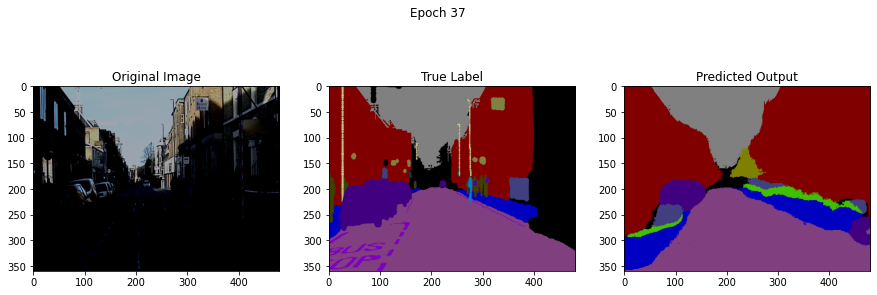

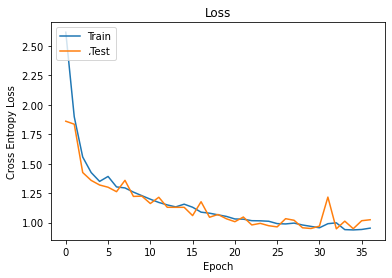

**********Epoch: 38 **********
 Epoch 38,  Iteration     9,  Loss: 0.888
 Epoch 38,  Iteration    19,  Loss: 0.919
 Epoch 38,  Iteration    29,  Loss: 0.944
 Epoch 38,  Iteration    39,  Loss: 0.933
 Epoch 38,  Iteration    49,  Loss: 0.908
 Epoch 38,  Iteration    59,  Loss: 0.909
 Epoch 38,  Iteration    69,  Loss: 0.910
 Epoch 38,  Iteration    79,  Loss: 0.919
 Epoch 38,  Iteration    89,  Loss: 0.929
 Epoch 38,  Iteration    99,  Loss: 0.926
 Epoch 38,  Iteration   109,  Loss: 0.919
 Epoch 38,  Iteration   119,  Loss: 0.922
 Epoch 38,  Iteration   129,  Loss: 0.921
 Epoch 38,  Iteration   139,  Loss: 0.919
TestLoss:  0.9292063696516885


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


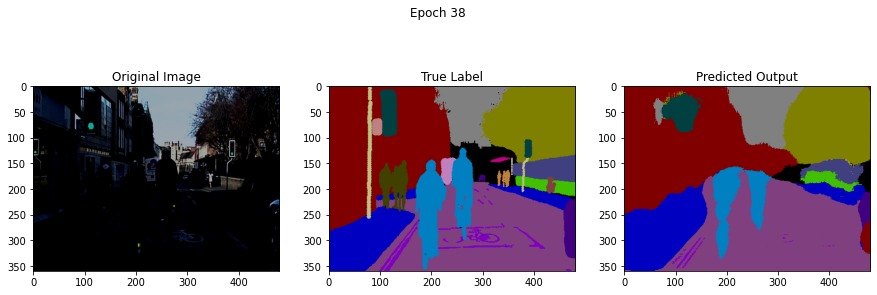

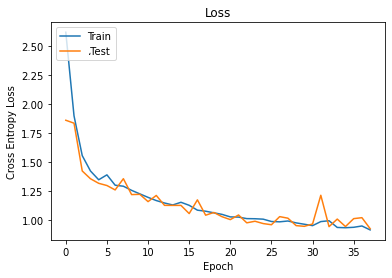

**********Epoch: 39 **********
 Epoch 39,  Iteration     9,  Loss: 0.908
 Epoch 39,  Iteration    19,  Loss: 0.949
 Epoch 39,  Iteration    29,  Loss: 0.947
 Epoch 39,  Iteration    39,  Loss: 0.948
 Epoch 39,  Iteration    49,  Loss: 0.944
 Epoch 39,  Iteration    59,  Loss: 0.955
 Epoch 39,  Iteration    69,  Loss: 0.946
 Epoch 39,  Iteration    79,  Loss: 0.941
 Epoch 39,  Iteration    89,  Loss: 0.936
 Epoch 39,  Iteration    99,  Loss: 0.940
 Epoch 39,  Iteration   109,  Loss: 0.942
 Epoch 39,  Iteration   119,  Loss: 0.936
 Epoch 39,  Iteration   129,  Loss: 0.937
 Epoch 39,  Iteration   139,  Loss: 0.939
TestLoss:  0.9069055004252328


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


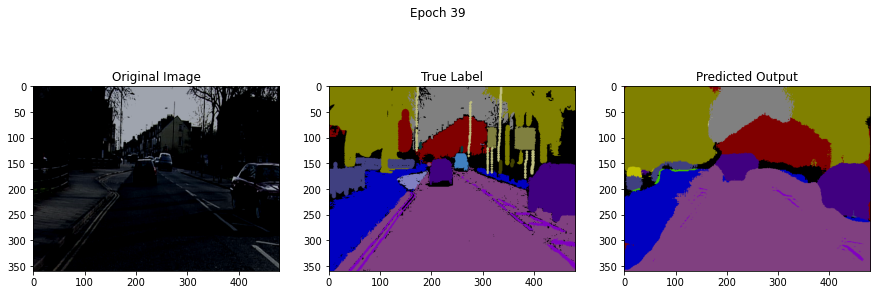

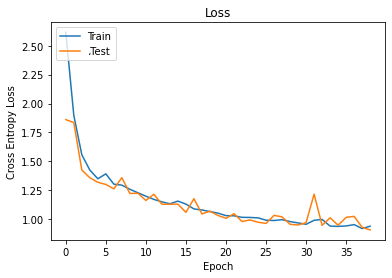

**********Epoch: 40 **********
 Epoch 40,  Iteration     9,  Loss: 0.877
 Epoch 40,  Iteration    19,  Loss: 0.930
 Epoch 40,  Iteration    29,  Loss: 0.934
 Epoch 40,  Iteration    39,  Loss: 0.943
 Epoch 40,  Iteration    49,  Loss: 0.944
 Epoch 40,  Iteration    59,  Loss: 0.941
 Epoch 40,  Iteration    69,  Loss: 0.934
 Epoch 40,  Iteration    79,  Loss: 0.933
 Epoch 40,  Iteration    89,  Loss: 0.918
 Epoch 40,  Iteration    99,  Loss: 0.927
 Epoch 40,  Iteration   109,  Loss: 0.923
 Epoch 40,  Iteration   119,  Loss: 0.920
 Epoch 40,  Iteration   129,  Loss: 0.922
 Epoch 40,  Iteration   139,  Loss: 0.918
TestLoss:  0.9135729322830836


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


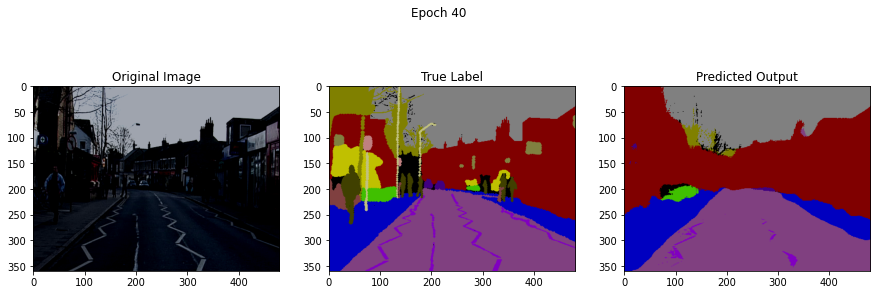

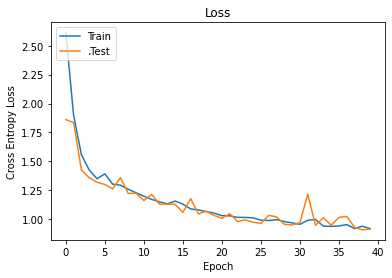

**********Epoch: 41 **********
 Epoch 41,  Iteration     9,  Loss: 0.866
 Epoch 41,  Iteration    19,  Loss: 0.870
 Epoch 41,  Iteration    29,  Loss: 0.894
 Epoch 41,  Iteration    39,  Loss: 0.940
 Epoch 41,  Iteration    49,  Loss: 0.956
 Epoch 41,  Iteration    59,  Loss: 0.955
 Epoch 41,  Iteration    69,  Loss: 0.943
 Epoch 41,  Iteration    79,  Loss: 0.928
 Epoch 41,  Iteration    89,  Loss: 0.924
 Epoch 41,  Iteration    99,  Loss: 0.927
 Epoch 41,  Iteration   109,  Loss: 0.919
 Epoch 41,  Iteration   119,  Loss: 0.919
 Epoch 41,  Iteration   129,  Loss: 0.914
 Epoch 41,  Iteration   139,  Loss: 0.910
TestLoss:  0.9290068431033028


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


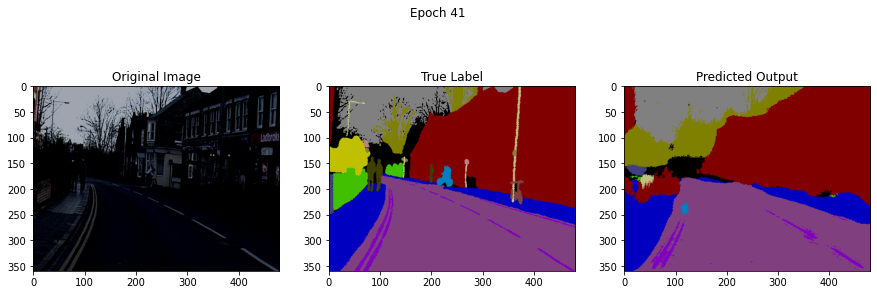

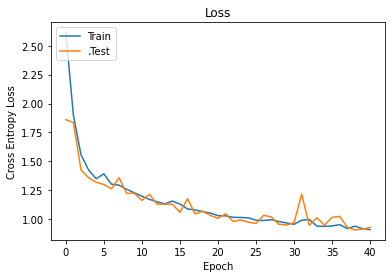

**********Epoch: 42 **********
 Epoch 42,  Iteration     9,  Loss: 0.878
 Epoch 42,  Iteration    19,  Loss: 0.900
 Epoch 42,  Iteration    29,  Loss: 0.947
 Epoch 42,  Iteration    39,  Loss: 0.934
 Epoch 42,  Iteration    49,  Loss: 0.922
 Epoch 42,  Iteration    59,  Loss: 0.926
 Epoch 42,  Iteration    69,  Loss: 0.921
 Epoch 42,  Iteration    79,  Loss: 0.930
 Epoch 42,  Iteration    89,  Loss: 0.930
 Epoch 42,  Iteration    99,  Loss: 0.925
 Epoch 42,  Iteration   109,  Loss: 0.916
 Epoch 42,  Iteration   119,  Loss: 0.921
 Epoch 42,  Iteration   129,  Loss: 0.920
 Epoch 42,  Iteration   139,  Loss: 0.927
TestLoss:  0.9253314965301089


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


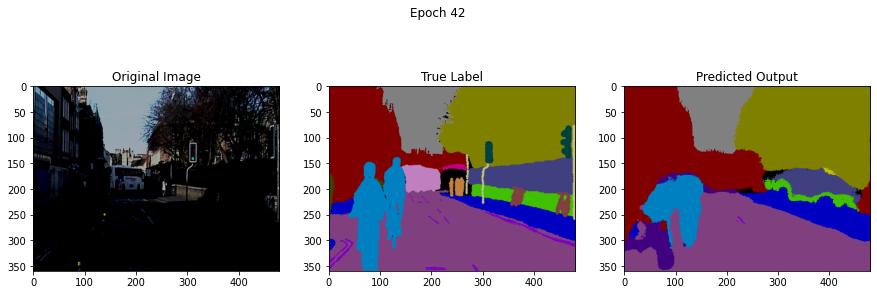

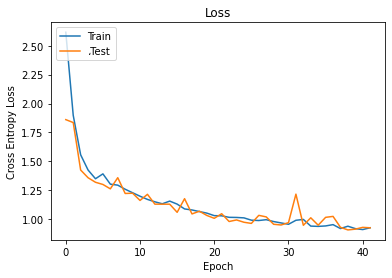

**********Epoch: 43 **********
 Epoch 43,  Iteration     9,  Loss: 0.982
 Epoch 43,  Iteration    19,  Loss: 0.925
 Epoch 43,  Iteration    29,  Loss: 0.955
 Epoch 43,  Iteration    39,  Loss: 0.947
 Epoch 43,  Iteration    49,  Loss: 0.957
 Epoch 43,  Iteration    59,  Loss: 0.943
 Epoch 43,  Iteration    69,  Loss: 0.935
 Epoch 43,  Iteration    79,  Loss: 0.933
 Epoch 43,  Iteration    89,  Loss: 0.927
 Epoch 43,  Iteration    99,  Loss: 0.926
 Epoch 43,  Iteration   109,  Loss: 0.919
 Epoch 43,  Iteration   119,  Loss: 0.913
 Epoch 43,  Iteration   129,  Loss: 0.912
 Epoch 43,  Iteration   139,  Loss: 0.907
TestLoss:  0.8891123384237289


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


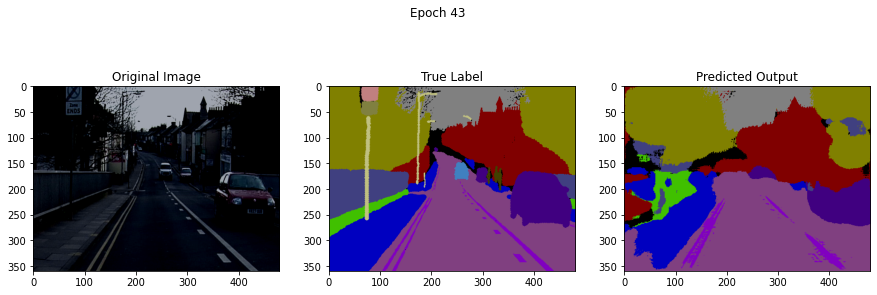

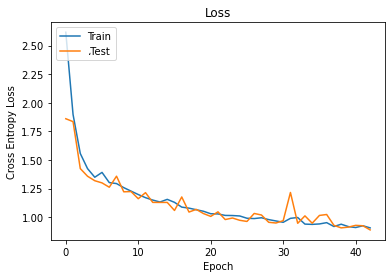

**********Epoch: 44 **********
 Epoch 44,  Iteration     9,  Loss: 0.882
 Epoch 44,  Iteration    19,  Loss: 0.909
 Epoch 44,  Iteration    29,  Loss: 0.915
 Epoch 44,  Iteration    39,  Loss: 0.903
 Epoch 44,  Iteration    49,  Loss: 0.912
 Epoch 44,  Iteration    59,  Loss: 0.902
 Epoch 44,  Iteration    69,  Loss: 0.912
 Epoch 44,  Iteration    79,  Loss: 0.913
 Epoch 44,  Iteration    89,  Loss: 0.907
 Epoch 44,  Iteration    99,  Loss: 0.901
 Epoch 44,  Iteration   109,  Loss: 0.898
 Epoch 44,  Iteration   119,  Loss: 0.902
 Epoch 44,  Iteration   129,  Loss: 0.898
 Epoch 44,  Iteration   139,  Loss: 0.905
TestLoss:  0.9246418492661582


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


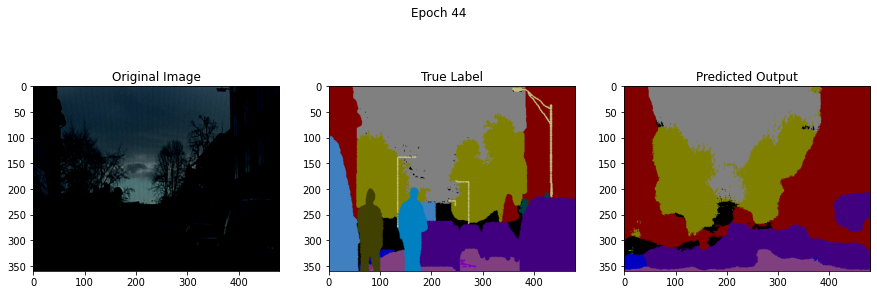

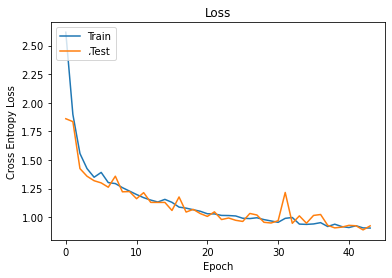

**********Epoch: 45 **********
 Epoch 45,  Iteration     9,  Loss: 0.869
 Epoch 45,  Iteration    19,  Loss: 0.871
 Epoch 45,  Iteration    29,  Loss: 0.921
 Epoch 45,  Iteration    39,  Loss: 0.908
 Epoch 45,  Iteration    49,  Loss: 0.909
 Epoch 45,  Iteration    59,  Loss: 0.916
 Epoch 45,  Iteration    69,  Loss: 0.918
 Epoch 45,  Iteration    79,  Loss: 0.905
 Epoch 45,  Iteration    89,  Loss: 0.903
 Epoch 45,  Iteration    99,  Loss: 0.900
 Epoch 45,  Iteration   109,  Loss: 0.904
 Epoch 45,  Iteration   119,  Loss: 0.899
 Epoch 45,  Iteration   129,  Loss: 0.898
 Epoch 45,  Iteration   139,  Loss: 0.906
TestLoss:  0.9065462251504263


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


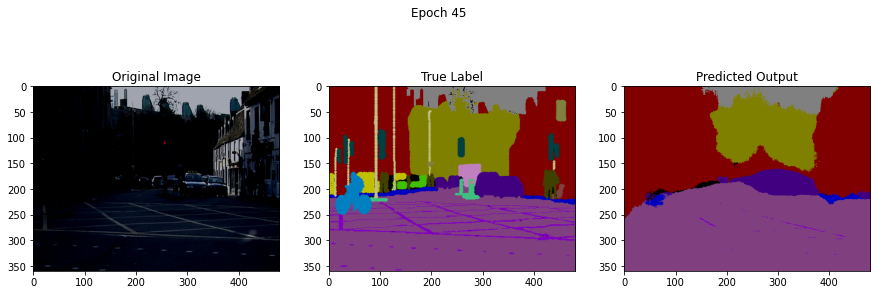

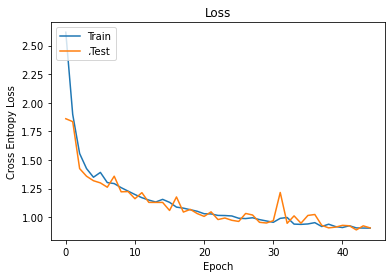

**********Epoch: 46 **********
 Epoch 46,  Iteration     9,  Loss: 0.920
 Epoch 46,  Iteration    19,  Loss: 0.924
 Epoch 46,  Iteration    29,  Loss: 0.894
 Epoch 46,  Iteration    39,  Loss: 0.880
 Epoch 46,  Iteration    49,  Loss: 0.880
 Epoch 46,  Iteration    59,  Loss: 0.901
 Epoch 46,  Iteration    69,  Loss: 0.903
 Epoch 46,  Iteration    79,  Loss: 0.901
 Epoch 46,  Iteration    89,  Loss: 0.903
 Epoch 46,  Iteration    99,  Loss: 0.905
 Epoch 46,  Iteration   109,  Loss: 0.899
 Epoch 46,  Iteration   119,  Loss: 0.898
 Epoch 46,  Iteration   129,  Loss: 0.897
 Epoch 46,  Iteration   139,  Loss: 0.905
TestLoss:  0.9142858766847186


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


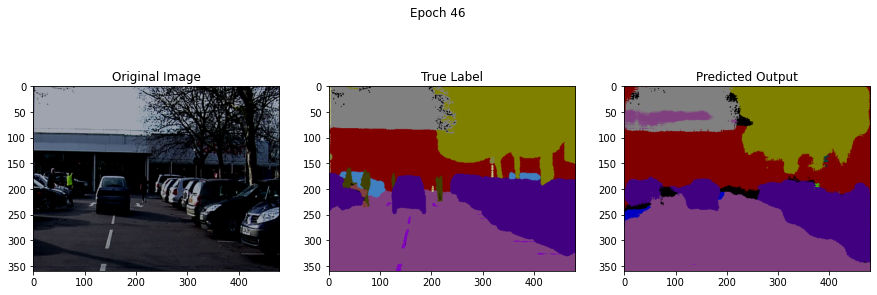

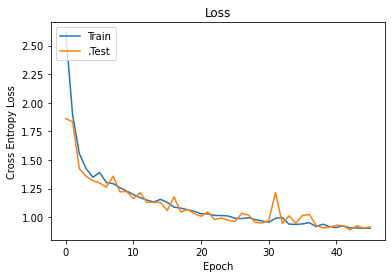

**********Epoch: 47 **********
 Epoch 47,  Iteration     9,  Loss: 0.959
 Epoch 47,  Iteration    19,  Loss: 0.943
 Epoch 47,  Iteration    29,  Loss: 0.900
 Epoch 47,  Iteration    39,  Loss: 0.880
 Epoch 47,  Iteration    49,  Loss: 0.881
 Epoch 47,  Iteration    59,  Loss: 0.889
 Epoch 47,  Iteration    69,  Loss: 0.889
 Epoch 47,  Iteration    79,  Loss: 0.880
 Epoch 47,  Iteration    89,  Loss: 0.878
 Epoch 47,  Iteration    99,  Loss: 0.876
 Epoch 47,  Iteration   109,  Loss: 0.885
 Epoch 47,  Iteration   119,  Loss: 0.886
 Epoch 47,  Iteration   129,  Loss: 0.890
 Epoch 47,  Iteration   139,  Loss: 0.892
TestLoss:  0.8988360630141364


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


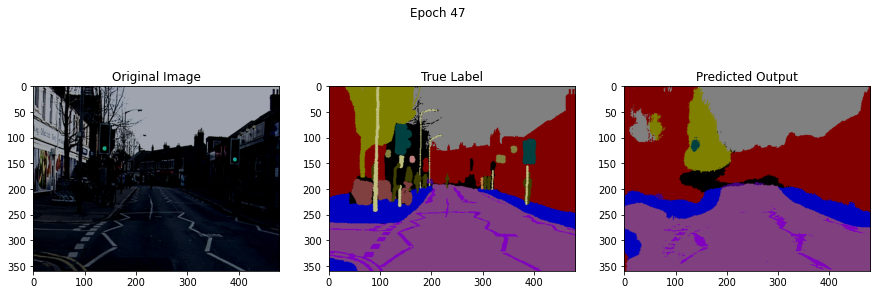

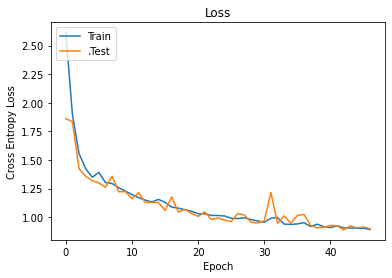

**********Epoch: 48 **********
 Epoch 48,  Iteration     9,  Loss: 0.940
 Epoch 48,  Iteration    19,  Loss: 0.925
 Epoch 48,  Iteration    29,  Loss: 0.907
 Epoch 48,  Iteration    39,  Loss: 0.924
 Epoch 48,  Iteration    49,  Loss: 0.949
 Epoch 48,  Iteration    59,  Loss: 0.971
 Epoch 48,  Iteration    69,  Loss: 0.985
 Epoch 48,  Iteration    79,  Loss: 0.979
 Epoch 48,  Iteration    89,  Loss: 0.978
 Epoch 48,  Iteration    99,  Loss: 0.971
 Epoch 48,  Iteration   109,  Loss: 0.966
 Epoch 48,  Iteration   119,  Loss: 0.958
 Epoch 48,  Iteration   129,  Loss: 0.945
 Epoch 48,  Iteration   139,  Loss: 0.937
TestLoss:  0.9105231480465995


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


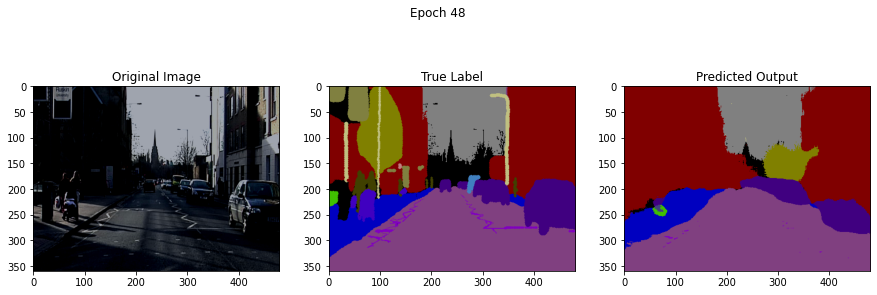

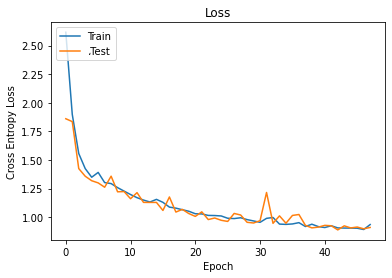

**********Epoch: 49 **********
 Epoch 49,  Iteration     9,  Loss: 0.925
 Epoch 49,  Iteration    19,  Loss: 0.946
 Epoch 49,  Iteration    29,  Loss: 0.938
 Epoch 49,  Iteration    39,  Loss: 0.936
 Epoch 49,  Iteration    49,  Loss: 0.920
 Epoch 49,  Iteration    59,  Loss: 0.934
 Epoch 49,  Iteration    69,  Loss: 0.928
 Epoch 49,  Iteration    79,  Loss: 0.917
 Epoch 49,  Iteration    89,  Loss: 0.923
 Epoch 49,  Iteration    99,  Loss: 0.928
 Epoch 49,  Iteration   109,  Loss: 0.915
 Epoch 49,  Iteration   119,  Loss: 0.908
 Epoch 49,  Iteration   129,  Loss: 0.923
 Epoch 49,  Iteration   139,  Loss: 0.928
TestLoss:  0.935771546430058


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


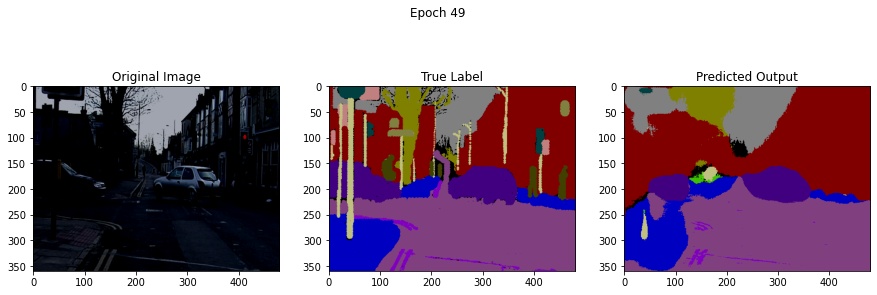

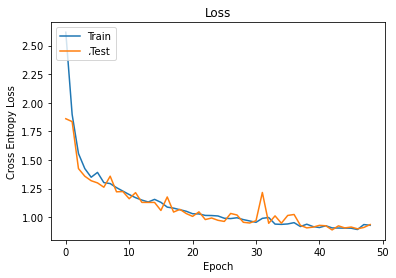

**********Epoch: 50 **********
 Epoch 50,  Iteration     9,  Loss: 1.043
 Epoch 50,  Iteration    19,  Loss: 1.010
 Epoch 50,  Iteration    29,  Loss: 0.974
 Epoch 50,  Iteration    39,  Loss: 0.971
 Epoch 50,  Iteration    49,  Loss: 0.954
 Epoch 50,  Iteration    59,  Loss: 0.931
 Epoch 50,  Iteration    69,  Loss: 0.920
 Epoch 50,  Iteration    79,  Loss: 0.915
 Epoch 50,  Iteration    89,  Loss: 0.909
 Epoch 50,  Iteration    99,  Loss: 0.905
 Epoch 50,  Iteration   109,  Loss: 0.902
 Epoch 50,  Iteration   119,  Loss: 0.898
 Epoch 50,  Iteration   129,  Loss: 0.897
 Epoch 50,  Iteration   139,  Loss: 0.896
TestLoss:  0.942256016863717


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


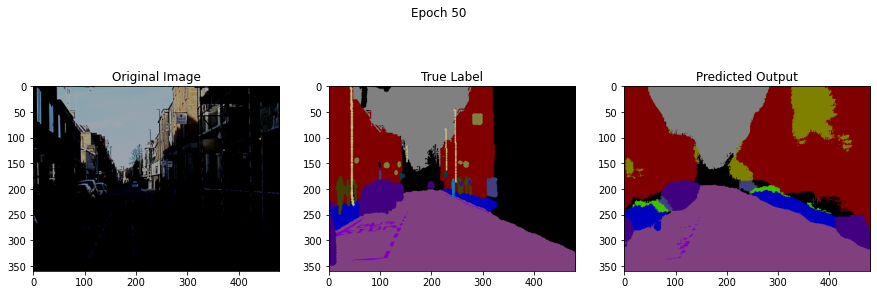

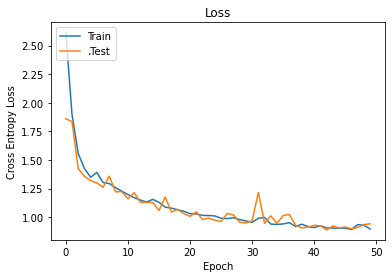

**********Epoch: 51 **********
 Epoch 51,  Iteration     9,  Loss: 0.841
 Epoch 51,  Iteration    19,  Loss: 0.858
 Epoch 51,  Iteration    29,  Loss: 0.897
 Epoch 51,  Iteration    39,  Loss: 0.903
 Epoch 51,  Iteration    49,  Loss: 0.892
 Epoch 51,  Iteration    59,  Loss: 0.887
 Epoch 51,  Iteration    69,  Loss: 0.899
 Epoch 51,  Iteration    79,  Loss: 0.900
 Epoch 51,  Iteration    89,  Loss: 0.898
 Epoch 51,  Iteration    99,  Loss: 0.900
 Epoch 51,  Iteration   109,  Loss: 0.894
 Epoch 51,  Iteration   119,  Loss: 0.897
 Epoch 51,  Iteration   129,  Loss: 0.891
 Epoch 51,  Iteration   139,  Loss: 0.888
TestLoss:  0.866956353187561


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


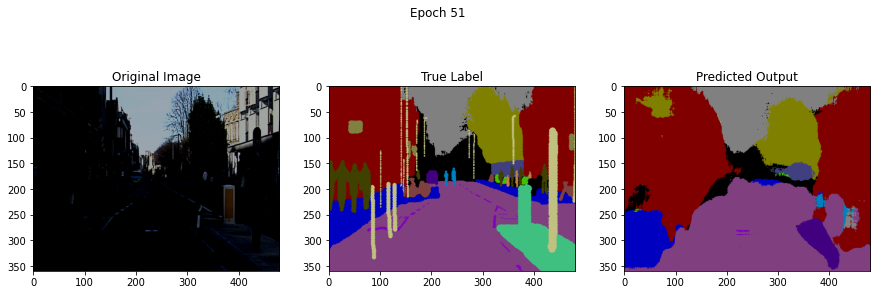

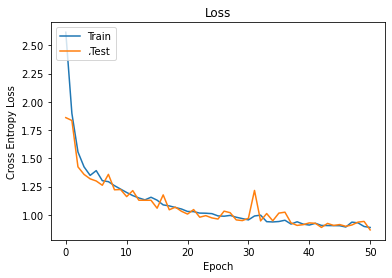

**********Epoch: 52 **********
 Epoch 52,  Iteration     9,  Loss: 0.830
 Epoch 52,  Iteration    19,  Loss: 0.861
 Epoch 52,  Iteration    29,  Loss: 0.892
 Epoch 52,  Iteration    39,  Loss: 0.878
 Epoch 52,  Iteration    49,  Loss: 0.878
 Epoch 52,  Iteration    59,  Loss: 0.882
 Epoch 52,  Iteration    69,  Loss: 0.883
 Epoch 52,  Iteration    79,  Loss: 0.889
 Epoch 52,  Iteration    89,  Loss: 0.881
 Epoch 52,  Iteration    99,  Loss: 0.875
 Epoch 52,  Iteration   109,  Loss: 0.869
 Epoch 52,  Iteration   119,  Loss: 0.872
 Epoch 52,  Iteration   129,  Loss: 0.876
 Epoch 52,  Iteration   139,  Loss: 0.880
TestLoss:  0.8956924908690982


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


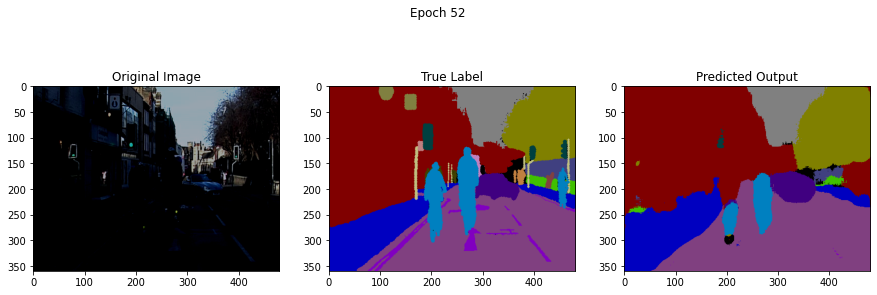

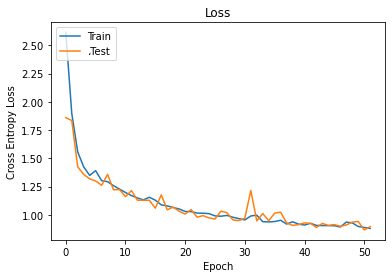

**********Epoch: 53 **********
 Epoch 53,  Iteration     9,  Loss: 0.825
 Epoch 53,  Iteration    19,  Loss: 0.821
 Epoch 53,  Iteration    29,  Loss: 0.855
 Epoch 53,  Iteration    39,  Loss: 0.838
 Epoch 53,  Iteration    49,  Loss: 0.854
 Epoch 53,  Iteration    59,  Loss: 0.872
 Epoch 53,  Iteration    69,  Loss: 0.876
 Epoch 53,  Iteration    79,  Loss: 0.887
 Epoch 53,  Iteration    89,  Loss: 0.889
 Epoch 53,  Iteration    99,  Loss: 0.887
 Epoch 53,  Iteration   109,  Loss: 0.887
 Epoch 53,  Iteration   119,  Loss: 0.888
 Epoch 53,  Iteration   129,  Loss: 0.891
 Epoch 53,  Iteration   139,  Loss: 0.888
TestLoss:  0.8778818233145608


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


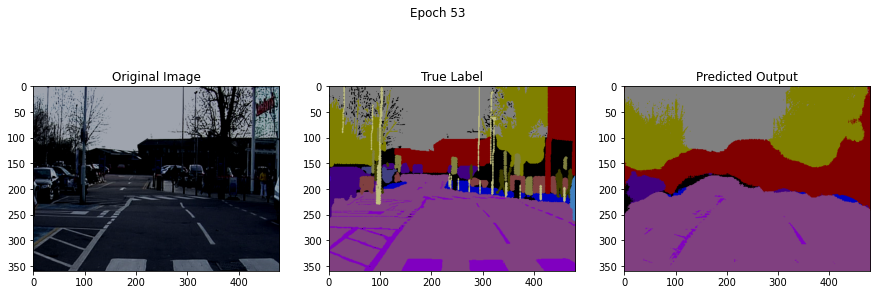

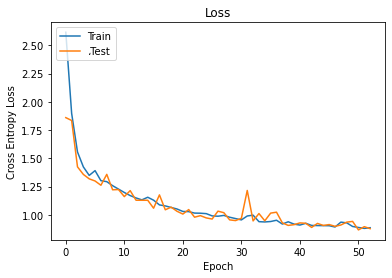

**********Epoch: 54 **********
 Epoch 54,  Iteration     9,  Loss: 0.903
 Epoch 54,  Iteration    19,  Loss: 0.896
 Epoch 54,  Iteration    29,  Loss: 0.883
 Epoch 54,  Iteration    39,  Loss: 0.864
 Epoch 54,  Iteration    49,  Loss: 0.866
 Epoch 54,  Iteration    59,  Loss: 0.872
 Epoch 54,  Iteration    69,  Loss: 0.923
 Epoch 54,  Iteration    79,  Loss: 0.969
 Epoch 54,  Iteration    89,  Loss: 1.001
 Epoch 54,  Iteration    99,  Loss: 1.020
 Epoch 54,  Iteration   109,  Loss: 1.027
 Epoch 54,  Iteration   119,  Loss: 1.026
 Epoch 54,  Iteration   129,  Loss: 1.010
 Epoch 54,  Iteration   139,  Loss: 1.002
TestLoss:  0.956920305887858


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


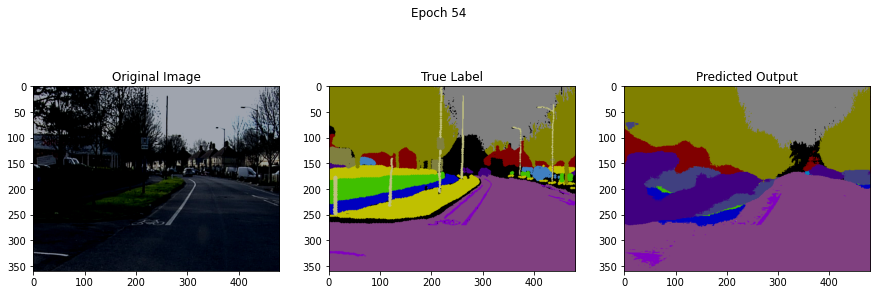

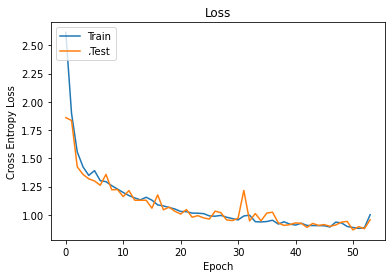

**********Epoch: 55 **********
 Epoch 55,  Iteration     9,  Loss: 0.946
 Epoch 55,  Iteration    19,  Loss: 0.929
 Epoch 55,  Iteration    29,  Loss: 0.948
 Epoch 55,  Iteration    39,  Loss: 0.917
 Epoch 55,  Iteration    49,  Loss: 0.913
 Epoch 55,  Iteration    59,  Loss: 0.892
 Epoch 55,  Iteration    69,  Loss: 0.898
 Epoch 55,  Iteration    79,  Loss: 0.900
 Epoch 55,  Iteration    89,  Loss: 0.895
 Epoch 55,  Iteration    99,  Loss: 0.887
 Epoch 55,  Iteration   109,  Loss: 0.894
 Epoch 55,  Iteration   119,  Loss: 0.897
 Epoch 55,  Iteration   129,  Loss: 0.894
 Epoch 55,  Iteration   139,  Loss: 0.891
TestLoss:  0.8896247578991784


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


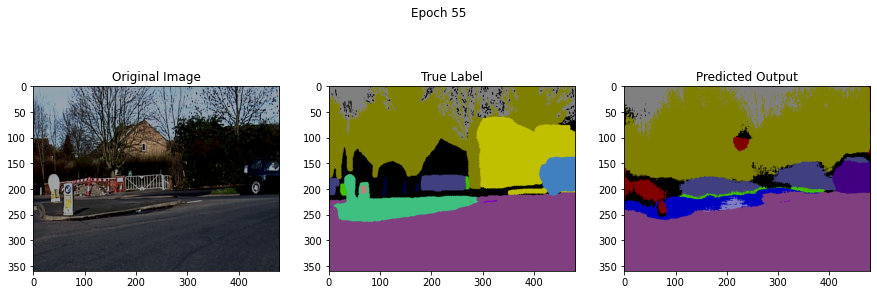

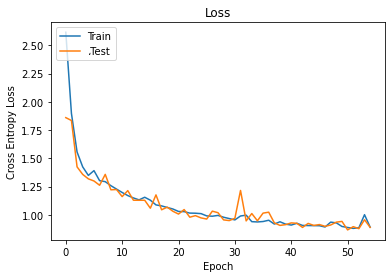

**********Epoch: 56 **********
 Epoch 56,  Iteration     9,  Loss: 0.785
 Epoch 56,  Iteration    19,  Loss: 0.841
 Epoch 56,  Iteration    29,  Loss: 0.880
 Epoch 56,  Iteration    39,  Loss: 0.860
 Epoch 56,  Iteration    49,  Loss: 0.864
 Epoch 56,  Iteration    59,  Loss: 0.871
 Epoch 56,  Iteration    69,  Loss: 0.885
 Epoch 56,  Iteration    79,  Loss: 0.879
 Epoch 56,  Iteration    89,  Loss: 0.877
 Epoch 56,  Iteration    99,  Loss: 0.880
 Epoch 56,  Iteration   109,  Loss: 0.872
 Epoch 56,  Iteration   119,  Loss: 0.873
 Epoch 56,  Iteration   129,  Loss: 0.887
 Epoch 56,  Iteration   139,  Loss: 0.880
TestLoss:  0.9033408694797092


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


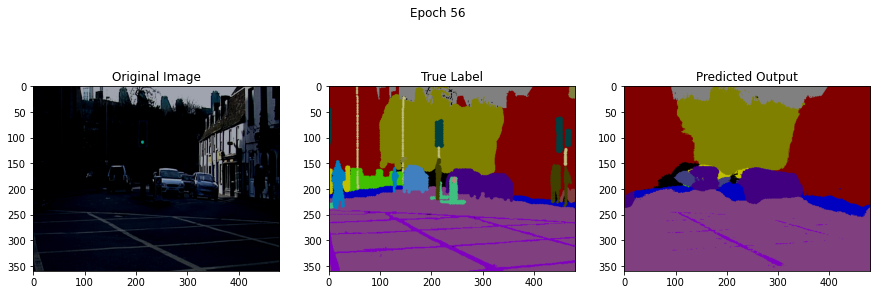

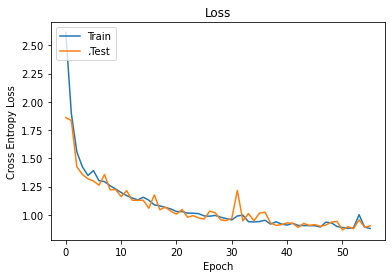

**********Epoch: 57 **********
 Epoch 57,  Iteration     9,  Loss: 0.826
 Epoch 57,  Iteration    19,  Loss: 0.870
 Epoch 57,  Iteration    29,  Loss: 0.894
 Epoch 57,  Iteration    39,  Loss: 0.883
 Epoch 57,  Iteration    49,  Loss: 0.886
 Epoch 57,  Iteration    59,  Loss: 0.896
 Epoch 57,  Iteration    69,  Loss: 0.896
 Epoch 57,  Iteration    79,  Loss: 0.898
 Epoch 57,  Iteration    89,  Loss: 0.895
 Epoch 57,  Iteration    99,  Loss: 0.886
 Epoch 57,  Iteration   109,  Loss: 0.874
 Epoch 57,  Iteration   119,  Loss: 0.868
 Epoch 57,  Iteration   129,  Loss: 0.861
 Epoch 57,  Iteration   139,  Loss: 0.866
TestLoss:  0.885602131485939


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


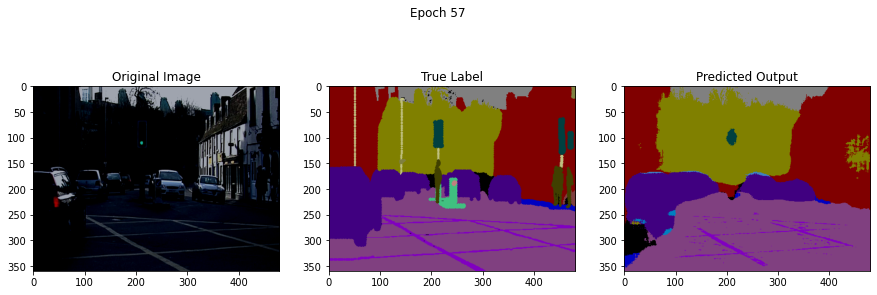

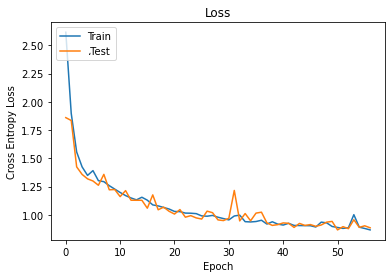

**********Epoch: 58 **********
 Epoch 58,  Iteration     9,  Loss: 0.881
 Epoch 58,  Iteration    19,  Loss: 0.856
 Epoch 58,  Iteration    29,  Loss: 0.849
 Epoch 58,  Iteration    39,  Loss: 0.841
 Epoch 58,  Iteration    49,  Loss: 0.874
 Epoch 58,  Iteration    59,  Loss: 0.871
 Epoch 58,  Iteration    69,  Loss: 0.877
 Epoch 58,  Iteration    79,  Loss: 0.884
 Epoch 58,  Iteration    89,  Loss: 0.889
 Epoch 58,  Iteration    99,  Loss: 0.883
 Epoch 58,  Iteration   109,  Loss: 0.882
 Epoch 58,  Iteration   119,  Loss: 0.883
 Epoch 58,  Iteration   129,  Loss: 0.880
 Epoch 58,  Iteration   139,  Loss: 0.880
TestLoss:  0.8882932580179639


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


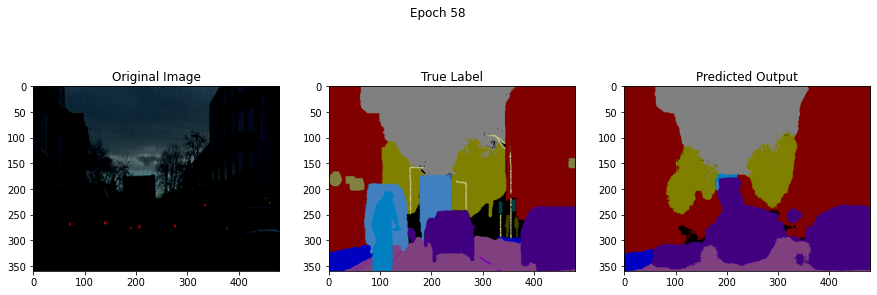

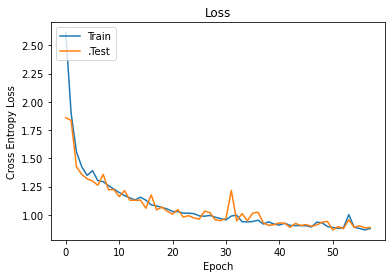

**********Epoch: 59 **********
 Epoch 59,  Iteration     9,  Loss: 0.916
 Epoch 59,  Iteration    19,  Loss: 0.858
 Epoch 59,  Iteration    29,  Loss: 0.851
 Epoch 59,  Iteration    39,  Loss: 0.866
 Epoch 59,  Iteration    49,  Loss: 0.861
 Epoch 59,  Iteration    59,  Loss: 0.850
 Epoch 59,  Iteration    69,  Loss: 0.850
 Epoch 59,  Iteration    79,  Loss: 0.844
 Epoch 59,  Iteration    89,  Loss: 0.841
 Epoch 59,  Iteration    99,  Loss: 0.845
 Epoch 59,  Iteration   109,  Loss: 0.865
 Epoch 59,  Iteration   119,  Loss: 0.878
 Epoch 59,  Iteration   129,  Loss: 0.878
 Epoch 59,  Iteration   139,  Loss: 0.877
TestLoss:  0.8769519279400507


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


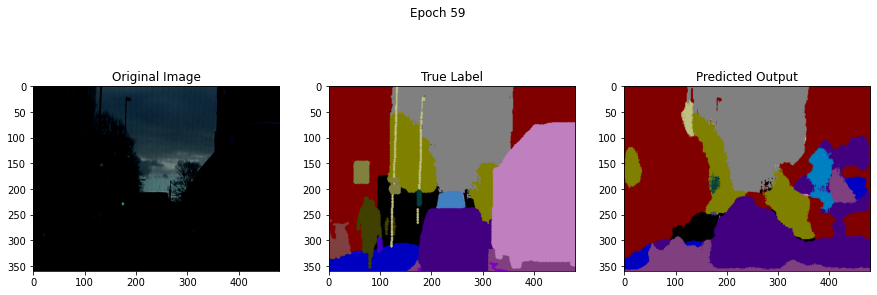

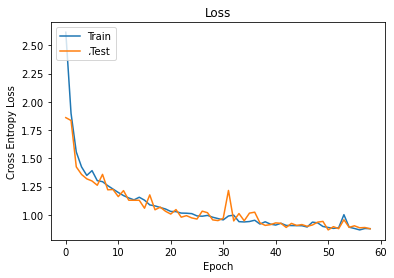

**********Epoch: 60 **********
 Epoch 60,  Iteration     9,  Loss: 0.827
 Epoch 60,  Iteration    19,  Loss: 0.812
 Epoch 60,  Iteration    29,  Loss: 0.835
 Epoch 60,  Iteration    39,  Loss: 0.842
 Epoch 60,  Iteration    49,  Loss: 0.857
 Epoch 60,  Iteration    59,  Loss: 0.865
 Epoch 60,  Iteration    69,  Loss: 0.864
 Epoch 60,  Iteration    79,  Loss: 0.855
 Epoch 60,  Iteration    89,  Loss: 0.862
 Epoch 60,  Iteration    99,  Loss: 0.865
 Epoch 60,  Iteration   109,  Loss: 0.860
 Epoch 60,  Iteration   119,  Loss: 0.860
 Epoch 60,  Iteration   129,  Loss: 0.861
 Epoch 60,  Iteration   139,  Loss: 0.861
TestLoss:  0.8628262496656842


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


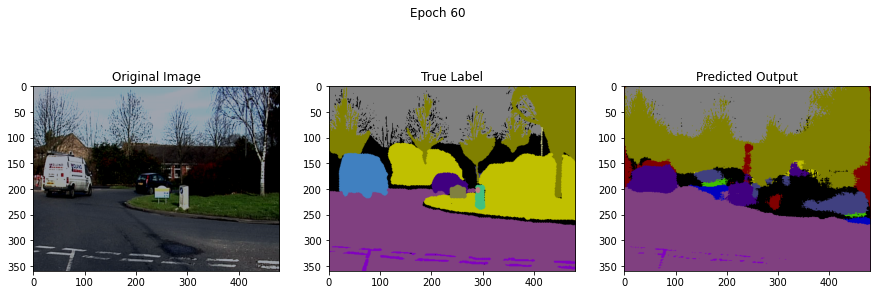

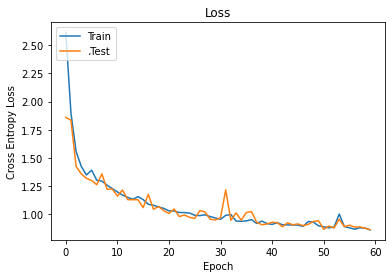

Finished Training


In [ ]:
for epoch in range(60):  # loop over the dataset multiple times
  print("**********Epoch:",epoch+1,"**********")
  lossEpoch = 0.0
  cnt = 0
  running_loss = 0.0
  net = net.train()
  for imData, imLabel in trainDataCamvid:
    cnt = cnt +1
    if torch.cuda.is_available:
      img = gradEnb(imData).cuda()
      imLabel =  gradEnb(imLabel).cuda()
    else:
      img = Variable(img)
      imLabel = Variable(imLabel)
    outputs = net(img)
    # forward + backward + optimize
    outputs = net(img)
    imLabel_Clnmb = torch.argmax(imLabel, dim=1)
    loss = criterion(outputs, imLabel_Clnmb)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
  # print statistics
    running_loss += loss.item()
    if cnt % 10 == 9:    
        print(' Epoch %d,  Iteration %5d,  Loss: %.3f' %
              (epoch + 1, cnt, running_loss /(cnt)))
        
  testLoss = calcTestLoss(testDataCamvid, net, criterion)
  print("TestLoss: ", testLoss)
  showResults(epoch_ = epoch+1, originalImg = img.cpu().numpy(), label = imLabel.cpu().numpy(), predictedResult = outputs.cpu())
  lossTrainHist.append(running_loss/cnt)
  lossTestHist.append(testLoss)
  epochHist.append(epoch)
  plotLoss(epochHist, lossTrainHist, lossTestHist)

  
    
            
          

print('Finished Training')

#<font color='Navy'>**Evaluation on Test Data**</font>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


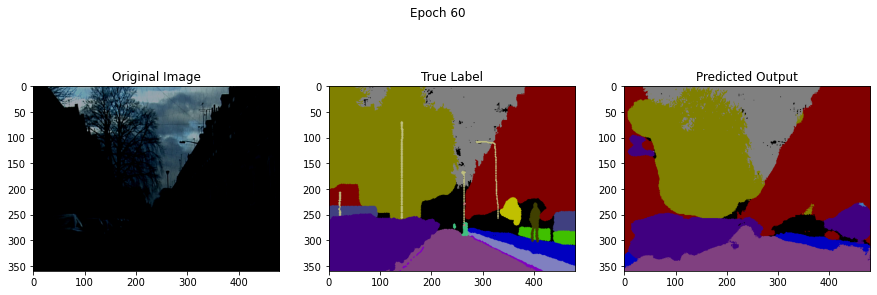

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


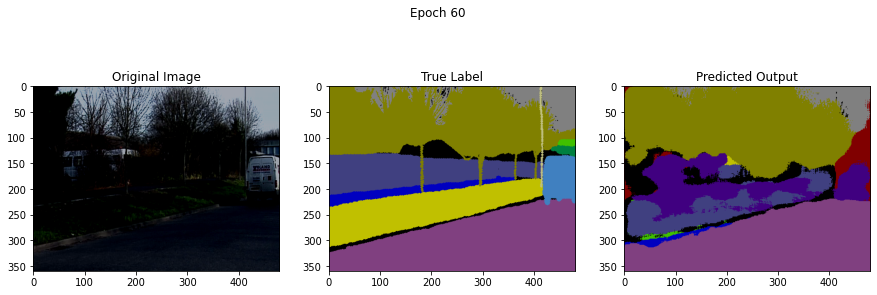

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


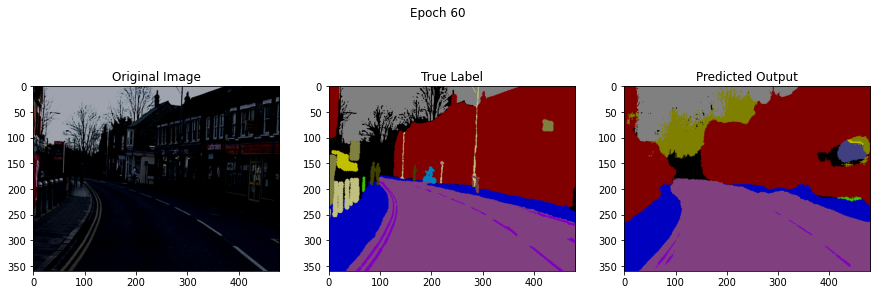

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


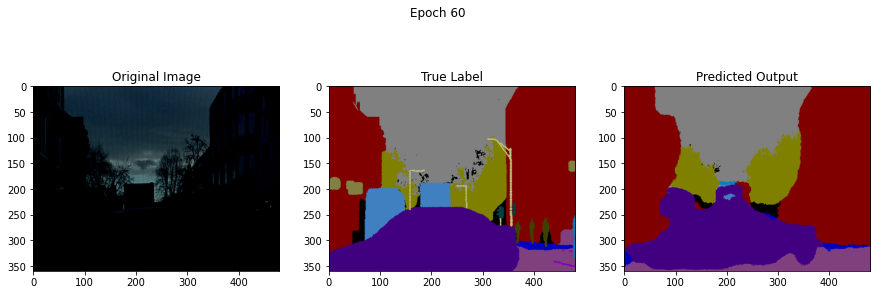

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


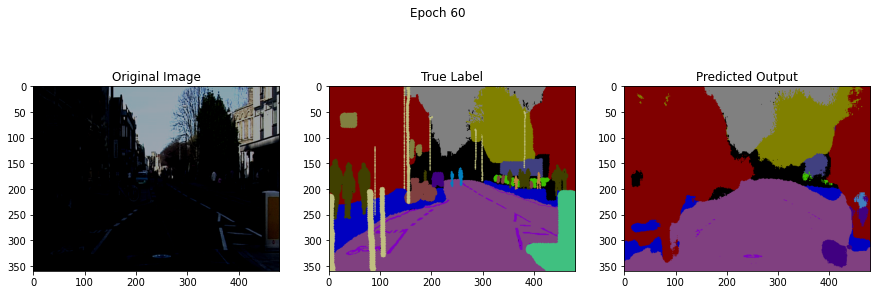

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


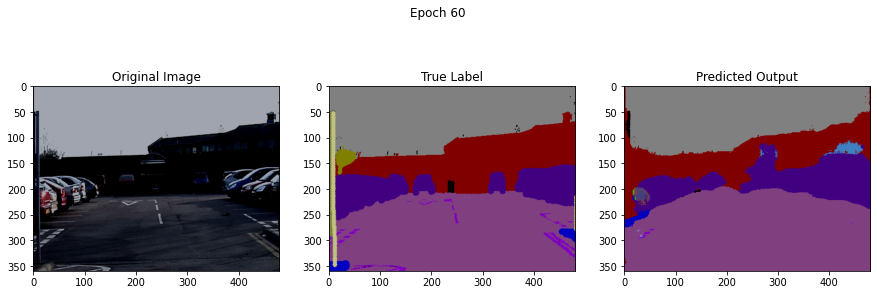

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


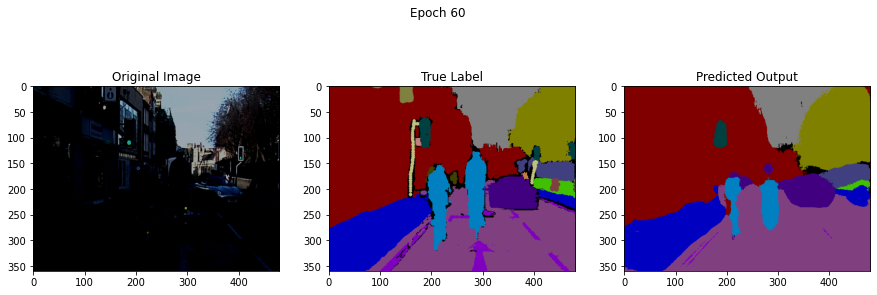

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


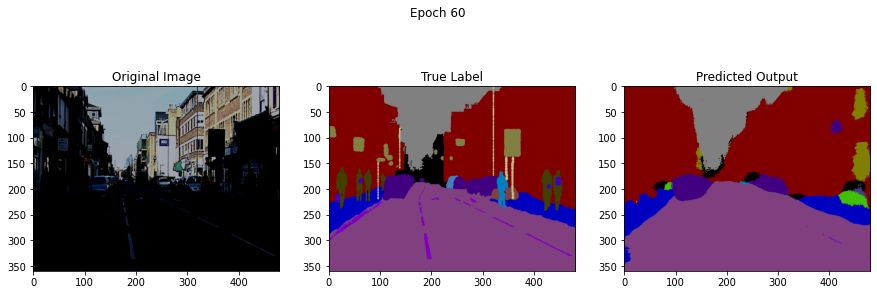

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


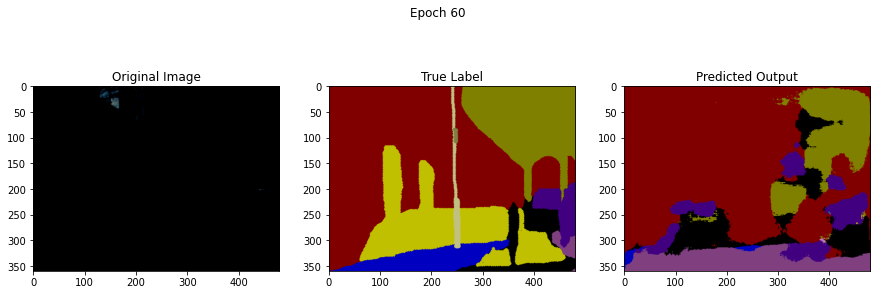

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


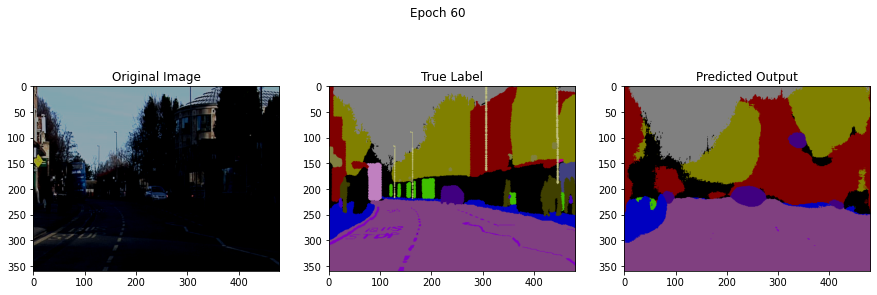

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


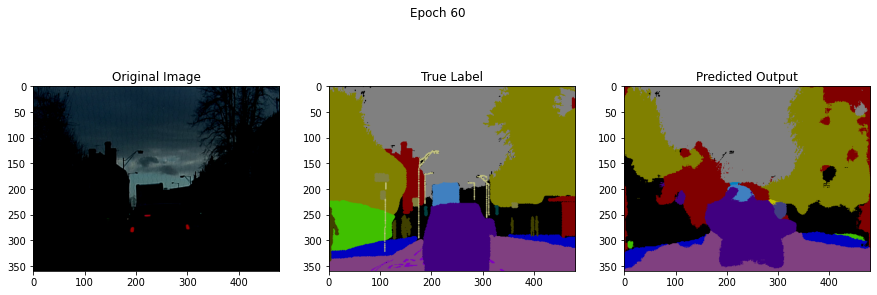

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


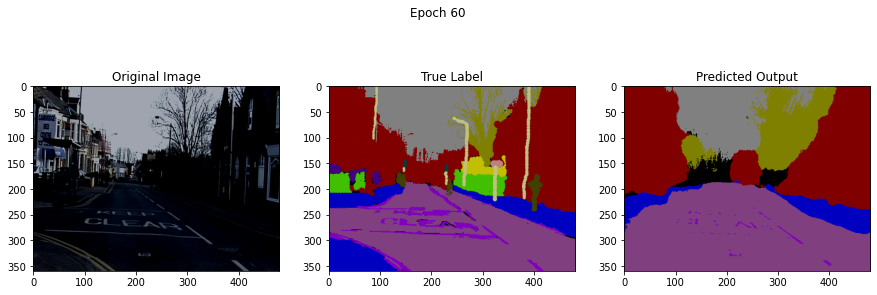

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


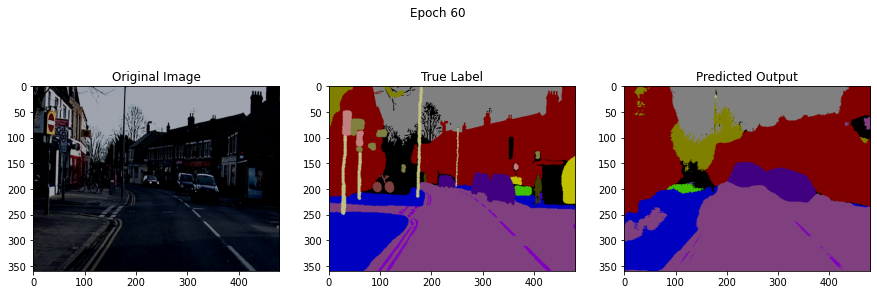

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


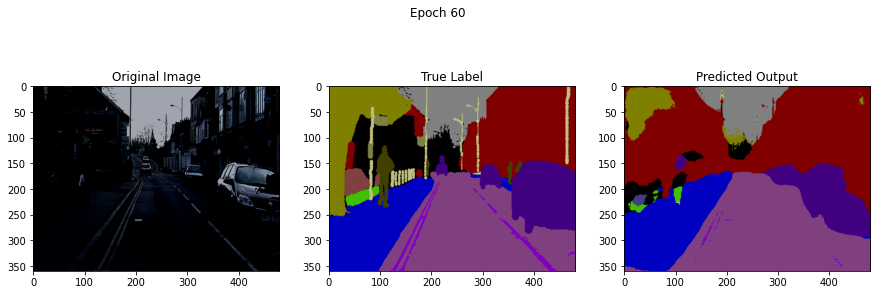

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


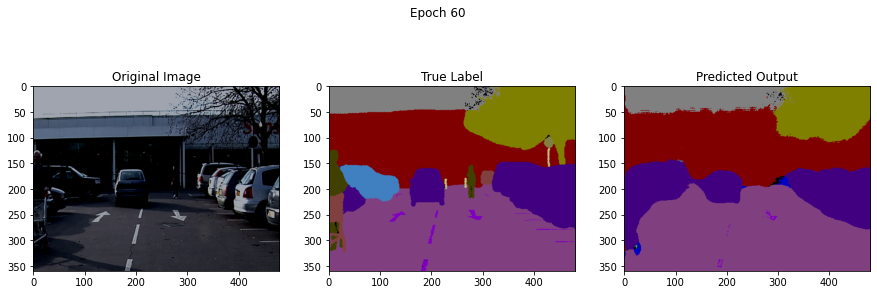

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


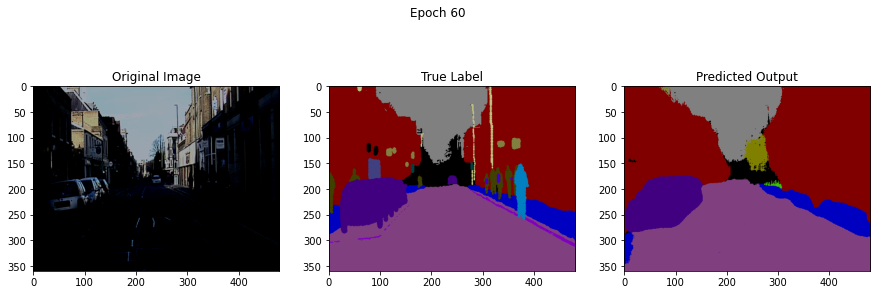

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


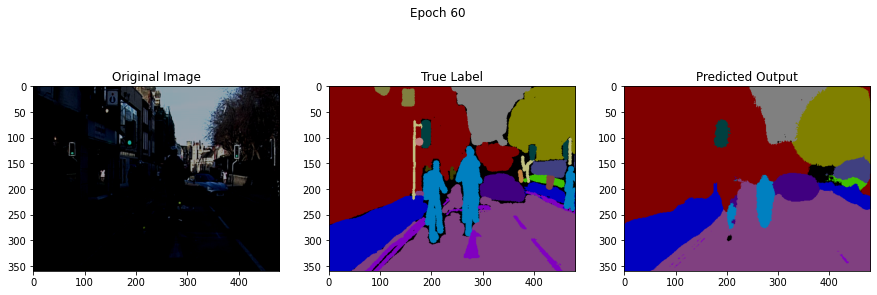

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


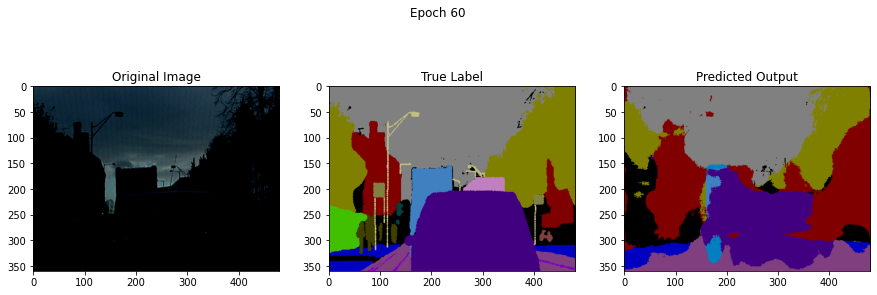

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


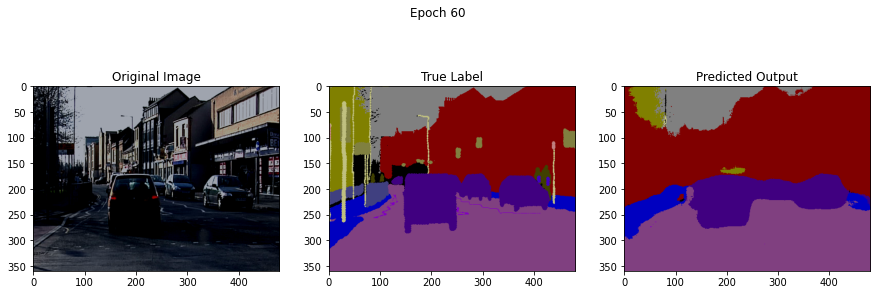

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


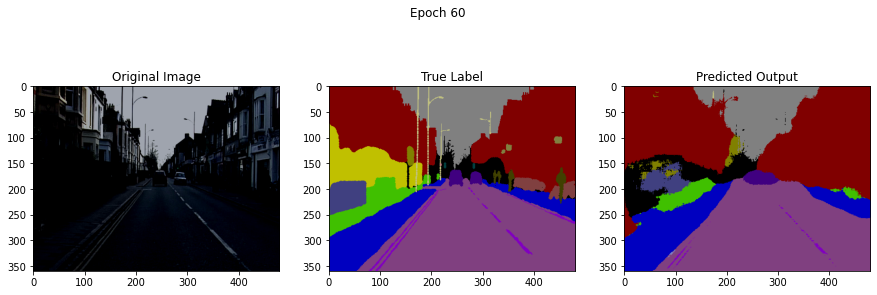

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


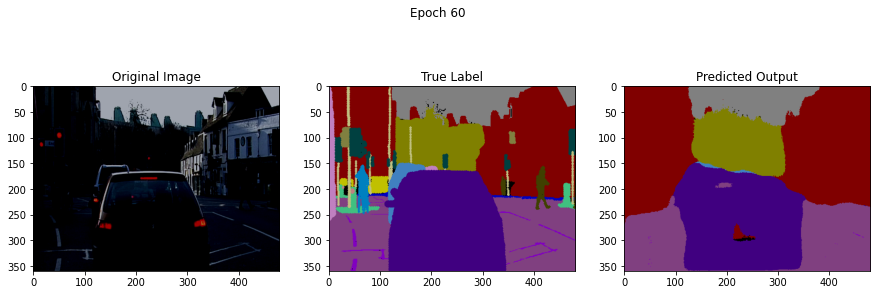

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


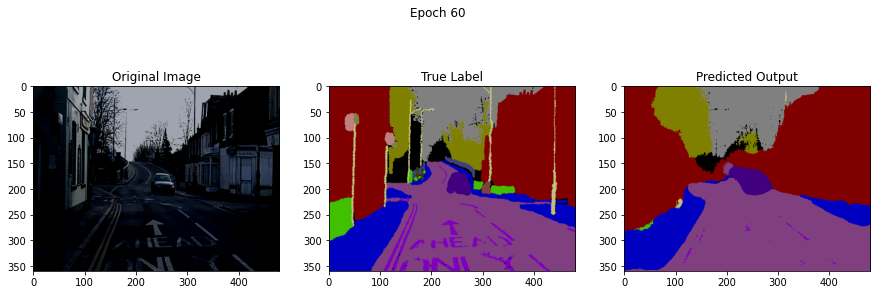

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


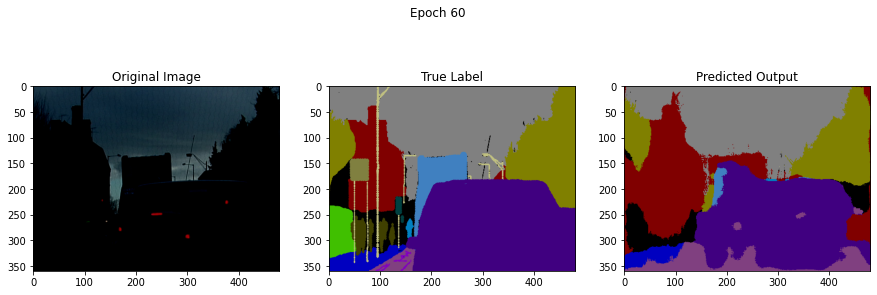

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


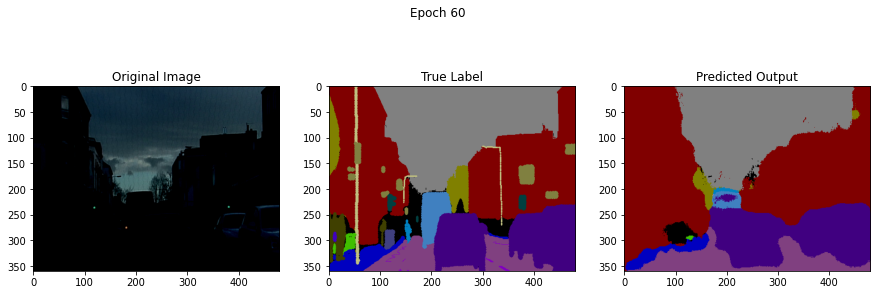

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


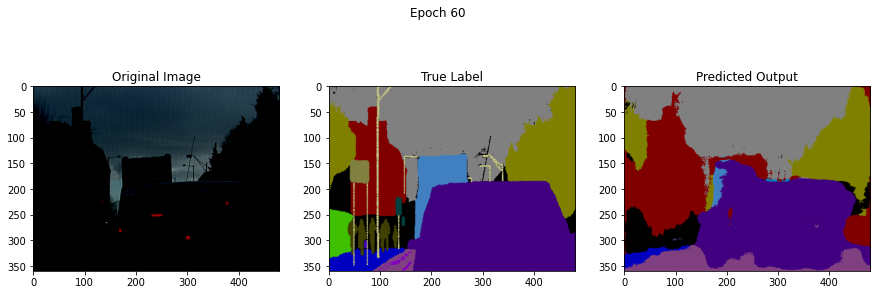

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


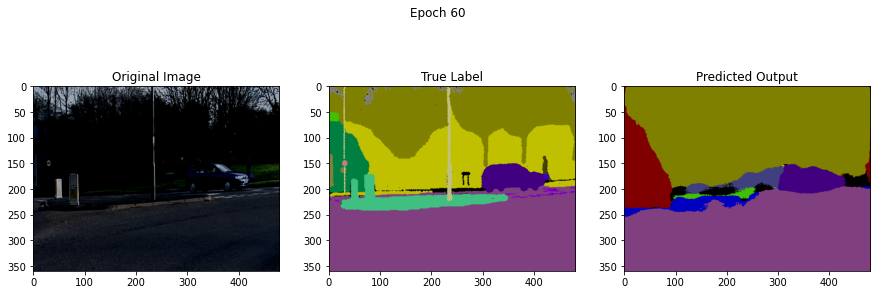

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


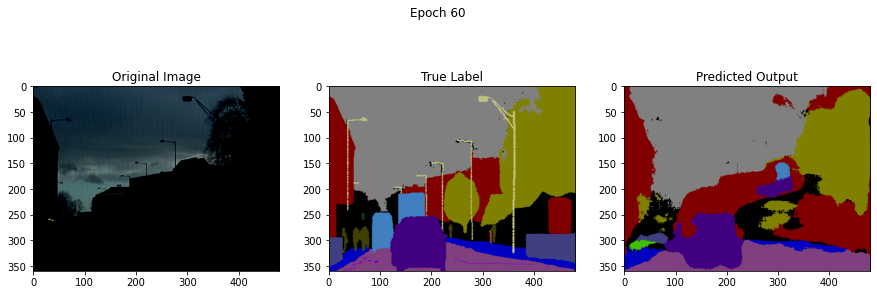

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


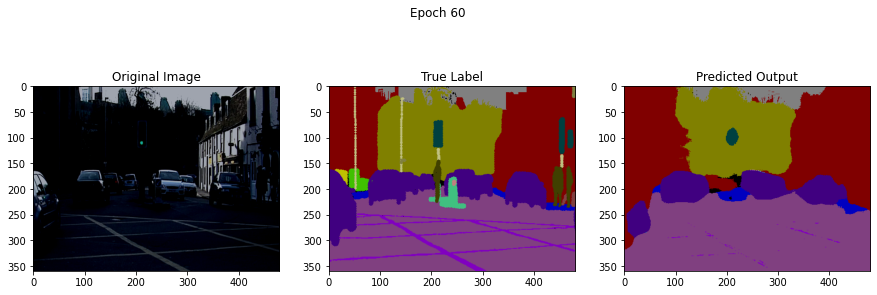

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


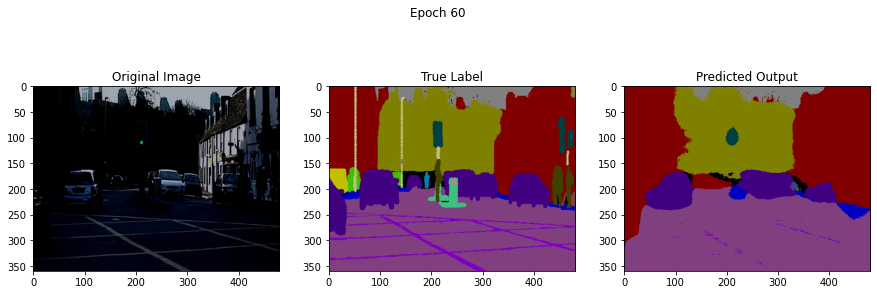

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


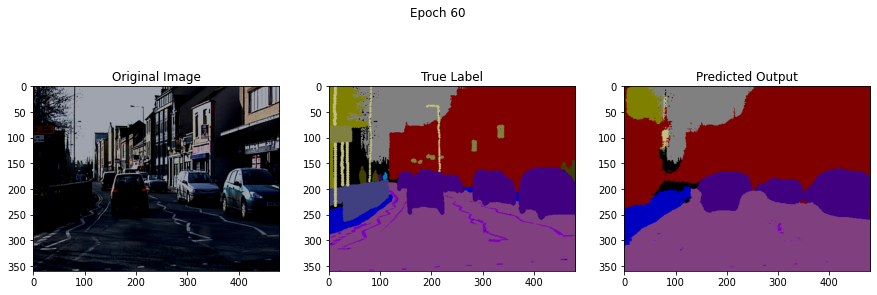

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


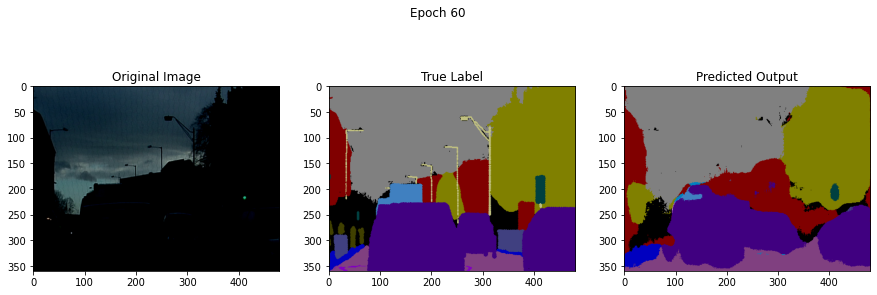

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


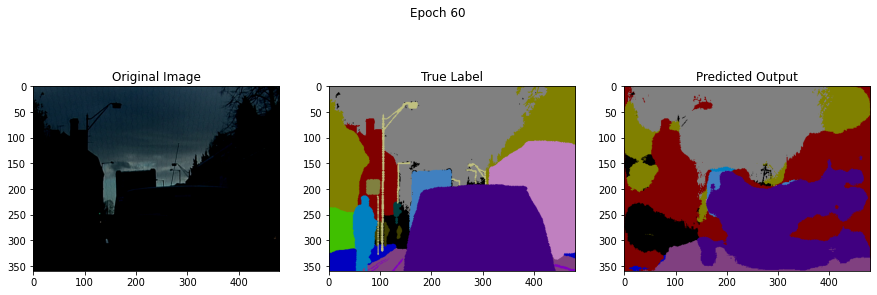

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


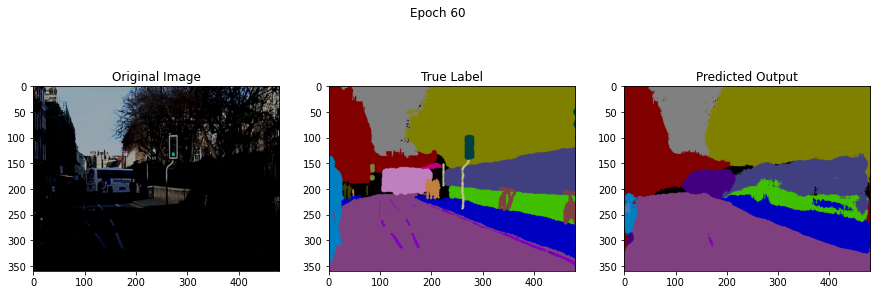

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


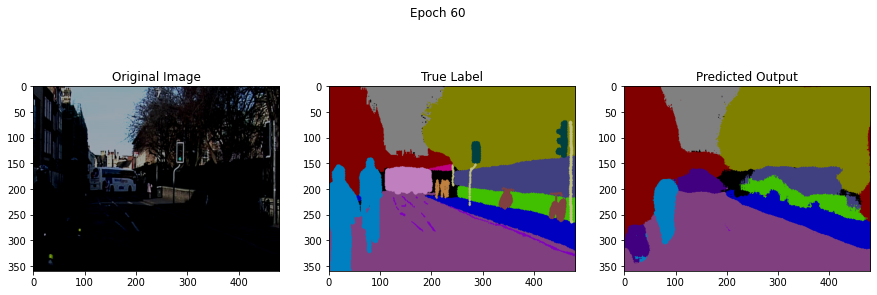

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


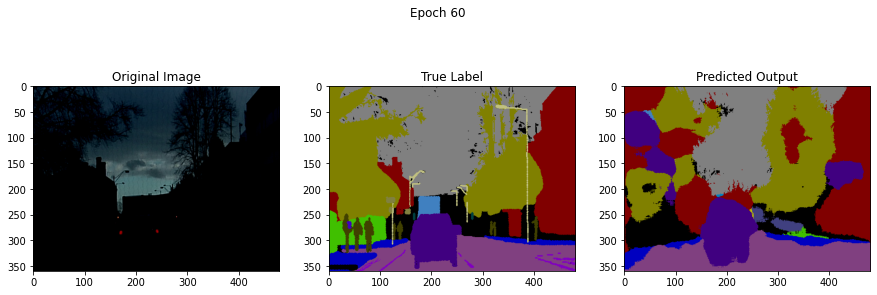

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


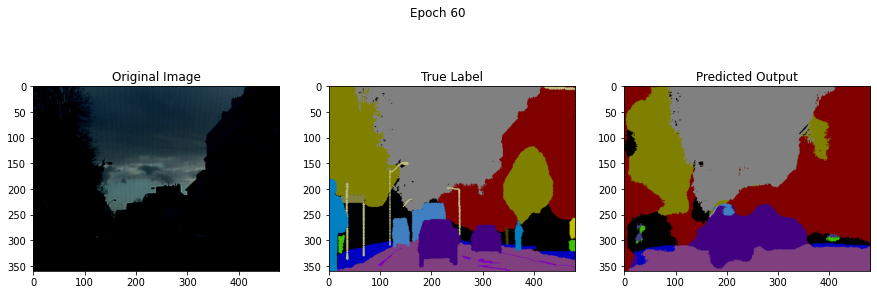

In [ ]:


for imData, imLabel in testDataCamvid:
    cnt = cnt +1
    if torch.cuda.is_available:
      img = gradEnb(imData).cuda()
      imLabel =  gradEnb(imLabel).cuda()
    else:
      img = Variable(img)
      imLabel = Variable(imLabel)
    outputs = net(img)
    outputs = net(img)
    imLabel_Clnmb = torch.argmax(imLabel, dim=1)
    showResults(epoch_ = epoch+1, originalImg = img.cpu().numpy(), label = imLabel.cpu().numpy(), predictedResult = outputs.cpu())